In [158]:
!pip install pandas-profiling

In [159]:
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import scipy.stats as st
import plotly.express as px
import matplotlib.pyplot as plt
from collections import Counter
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings("ignore")
sns.set(color_codes = True)
sns.set_palette(palette = 'mako', n_colors = 8)
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [160]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [161]:
data = pd.read_csv("/content/drive/MyDrive/Music File/mxmh_survey_results.csv")
df=data.copy()
df

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
0,8/27/2022 19:29:02,18.0,Spotify,3.0,Yes,Yes,Yes,Latin,Yes,Yes,...,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0,NaN,I understand.
1,8/27/2022 19:57:31,63.0,Pandora,1.5,Yes,No,No,Rock,Yes,No,...,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0,NaN,I understand.
2,8/27/2022 21:28:18,18.0,Spotify,4.0,No,No,No,Video game music,No,Yes,...,Never,Rarely,Rarely,Very frequently,7.0,7.0,10.0,2.0,No effect,I understand.
3,8/27/2022 21:40:40,61.0,YouTube Music,2.5,Yes,No,Yes,Jazz,Yes,Yes,...,Sometimes,Never,Never,Never,9.0,7.0,3.0,3.0,Improve,I understand.
4,8/27/2022 21:54:47,18.0,Spotify,4.0,Yes,No,No,R&B,Yes,No,...,Very frequently,Very frequently,Never,Rarely,7.0,2.0,5.0,9.0,Improve,I understand.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731,10/30/2022 14:37:28,17.0,Spotify,2.0,Yes,Yes,No,Rock,Yes,Yes,...,Never,Rarely,Very frequently,Never,7.0,6.0,0.0,9.0,Improve,I understand.
732,11/1/2022 22:26:42,18.0,Spotify,1.0,Yes,Yes,No,Pop,Yes,Yes,...,Never,Never,Sometimes,Sometimes,3.0,2.0,2.0,5.0,Improve,I understand.
733,11/3/2022 23:24:38,19.0,Other streaming service,6.0,Yes,No,Yes,Rap,Yes,No,...,Sometimes,Sometimes,Rarely,Rarely,2.0,2.0,2.0,2.0,Improve,I understand.
734,11/4/2022 17:31:47,19.0,Spotify,5.0,Yes,Yes,No,Classical,No,No,...,Never,Never,Never,Sometimes,2.0,3.0,2.0,1.0,Improve,I understand.


In [162]:
df.columns

Index(['Timestamp', 'Age', 'Primary streaming service', 'Hours per day',
       'While working', 'Instrumentalist', 'Composer', 'Fav genre',
       'Exploratory', 'Foreign languages', 'BPM', 'Frequency [Classical]',
       'Frequency [Country]', 'Frequency [EDM]', 'Frequency [Folk]',
       'Frequency [Gospel]', 'Frequency [Hip hop]', 'Frequency [Jazz]',
       'Frequency [K pop]', 'Frequency [Latin]', 'Frequency [Lofi]',
       'Frequency [Metal]', 'Frequency [Pop]', 'Frequency [R&B]',
       'Frequency [Rap]', 'Frequency [Rock]', 'Frequency [Video game music]',
       'Anxiety', 'Depression', 'Insomnia', 'OCD', 'Music effects',
       'Permissions'],
      dtype='object')

In [163]:
df.shape

(736, 33)

In [164]:
def check_df(df: object, head: object = 5) -> object:
    print("\nShape")
    print(df.shape)
    print("\nTypes")
    print(df.dtypes)
    print("\nNANs")
    print(df.isnull().sum())
    print("\nInfo")
    print(df.info())
check_df(df)


Shape
(736, 33)

Types
Timestamp                        object
Age                             float64
Primary streaming service        object
Hours per day                   float64
While working                    object
Instrumentalist                  object
Composer                         object
Fav genre                        object
Exploratory                      object
Foreign languages                object
BPM                             float64
Frequency [Classical]            object
Frequency [Country]              object
Frequency [EDM]                  object
Frequency [Folk]                 object
Frequency [Gospel]               object
Frequency [Hip hop]              object
Frequency [Jazz]                 object
Frequency [K pop]                object
Frequency [Latin]                object
Frequency [Lofi]                 object
Frequency [Metal]                object
Frequency [Pop]                  object
Frequency [R&B]                  object
Frequency [Rap] 

In [165]:
print('Number of duplicated rows: ' , len(df[df.duplicated()]))

Number of duplicated rows:  0


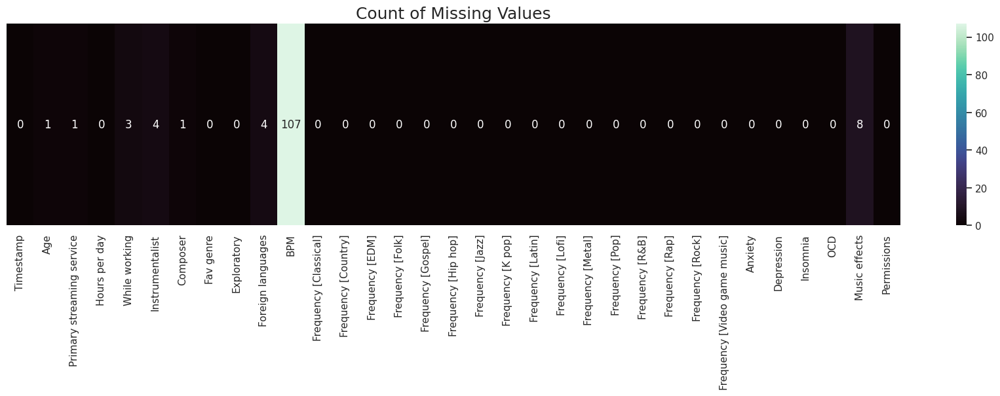

In [166]:
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap='mako', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=18)
plt.show()

In [167]:
df[df['Age'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
12,8/27/2022 23:04:00,NaN,Spotify,3.0,Yes,No,No,Hip hop,Yes,Yes,...,Sometimes,Rarely,Rarely,Never,9.0,3.0,2.0,7.0,Improve,I understand.


In [168]:
df[df['Primary streaming service'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
197,8/28/2022 20:50:37,21.0,NaN,5.0,Yes,No,No,Country,Yes,No,...,Never,Rarely,Very frequently,Never,9.0,8.0,9.0,7.0,Improve,I understand.


In [169]:
df[df['Instrumentalist'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
223,8/28/2022 22:06:46,18.0,YouTube Music,12.0,Yes,NaN,No,K pop,Yes,Yes,...,Sometimes,Sometimes,Rarely,Never,3.0,7.0,5.0,2.0,Improve,I understand.
408,8/29/2022 23:36:14,13.0,YouTube Music,3.0,Yes,NaN,Yes,Classical,No,No,...,Never,Never,Never,Never,8.0,7.0,9.0,2.0,Improve,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.
572,9/4/2022 21:29:06,18.0,Spotify,3.0,Yes,NaN,No,Video game music,Yes,Yes,...,Sometimes,Never,Never,Very frequently,7.0,0.0,3.0,1.0,No effect,I understand.


In [170]:
df[df['Composer'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.


In [171]:
df[df['Foreign languages'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
235,8/28/2022 22:39:58,31.0,Spotify,2.0,No,Yes,No,Metal,Yes,NaN,...,Rarely,Sometimes,Very frequently,Sometimes,7.0,6.0,6.0,5.0,Improve,I understand.
396,8/29/2022 20:03:04,14.0,YouTube Music,1.5,No,Yes,No,Classical,Yes,NaN,...,Never,Never,Rarely,Sometimes,1.0,2.0,4.0,3.0,Improve,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.
666,9/15/2022 0:33:58,15.0,Spotify,3.0,Yes,Yes,No,Rock,No,NaN,...,Never,Never,Very frequently,Rarely,4.0,3.0,5.0,0.0,No effect,I understand.


In [172]:
df[df['BPM'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
10,8/27/2022 22:51:15,18.0,Spotify,3.0,Yes,Yes,No,Country,Yes,No,...,Rarely,Never,Rarely,Never,7.0,7.0,4.0,7.0,No effect,I understand.
12,8/27/2022 23:04:00,NaN,Spotify,3.0,Yes,No,No,Hip hop,Yes,Yes,...,Sometimes,Rarely,Rarely,Never,9.0,3.0,2.0,7.0,Improve,I understand.
15,8/27/2022 23:19:52,17.0,Spotify,2.0,No,No,No,Pop,Yes,Yes,...,Rarely,Sometimes,Sometimes,Rarely,7.0,5.0,4.0,1.0,Worsen,I understand.
30,8/28/2022 10:30:22,20.0,Apple Music,5.0,Yes,Yes,No,Rock,Yes,Yes,...,Sometimes,Sometimes,Very frequently,Rarely,7.0,7.0,2.0,0.0,Improve,I understand.
32,8/28/2022 10:54:30,19.0,Spotify,6.0,Yes,Yes,No,Metal,Yes,Yes,...,Never,Never,Sometimes,Sometimes,9.0,8.0,2.0,3.0,Improve,I understand.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
688,9/24/2022 0:42:39,18.0,Spotify,4.0,Yes,No,No,R&B,No,No,...,Very frequently,Sometimes,Never,Never,8.0,0.0,0.0,2.0,No effect,I understand.
700,10/3/2022 10:00:01,20.0,YouTube Music,1.0,Yes,No,No,Pop,No,Yes,...,Rarely,Sometimes,Rarely,Very frequently,8.0,9.0,6.0,5.0,Worsen,I understand.
706,10/3/2022 15:38:19,23.0,Spotify,1.0,Yes,Yes,No,Rock,Yes,Yes,...,Sometimes,Sometimes,Very frequently,Very frequently,8.0,6.0,1.0,4.0,Improve,I understand.
712,10/4/2022 8:53:39,23.0,I do not use a streaming service.,3.0,Yes,No,No,Rock,No,No,...,Rarely,Never,Very frequently,Never,10.0,5.0,2.0,0.0,Improve,I understand.


In [173]:
df[df['While working'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
57,8/28/2022 13:08:24,42.0,I do not use a streaming service.,0.0,NaN,No,No,Rock,No,Yes,...,Rarely,Never,Sometimes,Sometimes,9.0,0.0,10.0,0.0,No effect,I understand.
426,8/30/2022 16:47:39,30.0,Spotify,13.0,NaN,No,No,K pop,Yes,Yes,...,Very frequently,Sometimes,Very frequently,Sometimes,10.0,10.0,10.0,7.0,Improve,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.


In [174]:
df[df['Music effects'].isnull()]

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
0,8/27/2022 19:29:02,18.0,Spotify,3.0,Yes,Yes,Yes,Latin,Yes,Yes,...,Sometimes,Very frequently,Never,Sometimes,3.0,0.0,1.0,0.0,NaN,I understand.
1,8/27/2022 19:57:31,63.0,Pandora,1.5,Yes,No,No,Rock,Yes,No,...,Sometimes,Rarely,Very frequently,Rarely,7.0,2.0,2.0,1.0,NaN,I understand.
161,8/28/2022 18:59:40,18.0,Other streaming service,2.0,Yes,No,No,K pop,No,Yes,...,Sometimes,Never,Never,Never,0.0,2.0,0.0,0.0,NaN,I understand.
168,8/28/2022 19:16:43,19.0,Spotify,3.0,Yes,Yes,No,K pop,Yes,Yes,...,Sometimes,Rarely,Sometimes,Sometimes,8.0,9.0,6.0,0.0,NaN,I understand.
338,8/29/2022 8:28:46,21.0,YouTube Music,2.0,Yes,No,No,EDM,No,Yes,...,Rarely,Rarely,Sometimes,Very frequently,10.0,10.0,5.0,7.0,NaN,I understand.
441,8/31/2022 18:56:31,21.0,Apple Music,1.5,Yes,Yes,No,Folk,No,No,...,Never,Never,Sometimes,Never,3.0,3.0,1.0,0.0,NaN,I understand.
532,9/2/2022 19:20:33,67.0,I do not use a streaming service.,1.0,No,No,No,Rock,No,No,...,Sometimes,Sometimes,Sometimes,Never,3.0,2.0,2.0,2.0,NaN,I understand.
561,9/4/2022 5:22:34,21.0,Spotify,1.0,NaN,NaN,NaN,K pop,Yes,NaN,...,Sometimes,Sometimes,Very frequently,Rarely,4.0,5.0,2.0,5.0,NaN,I understand.


In [175]:
# Remove columns whose null values are less than 10
df.dropna(subset=['Age','Primary streaming service','While working','Instrumentalist','Composer','Foreign languages','Music effects'],inplace=True)

In [176]:
df[df.columns[df.isnull().any()]].isnull().sum()

BPM    102
dtype: int64

In [177]:
df.describe()[1:].T.style.background_gradient(cmap='mako', axis=1)

,mean,std,min,25%,50%,75%,max
Age,25.176880,11.953918,10.000000,18.000000,21.000000,28.000000,89.000000
Hours per day,3.578064,3.017779,0.000000,2.000000,3.000000,5.000000,24.000000
BPM,1623500.001623,40291143.181798,0.000000,100.000000,120.000000,144.000000,999999999.000000
Anxiety,5.837744,2.784533,0.000000,4.000000,6.000000,8.000000,10.000000
Depression,4.806407,3.020061,0.000000,2.000000,5.000000,7.000000,10.000000
Insomnia,3.717967,3.084387,0.000000,1.000000,3.000000,6.000000,10.000000
OCD,2.635097,2.844382,0.000000,0.000000,2.000000,4.000000,10.000000


In [178]:
# finding unique data
df.apply(lambda x: len(x.unique()))

Timestamp                       717
Age                              61
Primary streaming service         6
Hours per day                    26
While working                     2
Instrumentalist                   2
Composer                          2
Fav genre                        16
Exploratory                       2
Foreign languages                 2
BPM                             136
Frequency [Classical]             4
Frequency [Country]               4
Frequency [EDM]                   4
Frequency [Folk]                  4
Frequency [Gospel]                4
Frequency [Hip hop]               4
Frequency [Jazz]                  4
Frequency [K pop]                 4
Frequency [Latin]                 4
Frequency [Lofi]                  4
Frequency [Metal]                 4
Frequency [Pop]                   4
Frequency [R&B]                   4
Frequency [Rap]                   4
Frequency [Rock]                  4
Frequency [Video game music]      4
Anxiety                     

In [179]:
unique = df.nunique().sort_values()
unique_values = df.apply(lambda x: x.unique())
pd.DataFrame({'Number of Unique Values': unique, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
Age,61,"[18.0, 61.0, 21.0, 19.0, 17.0, 16.0, 15.0, 14...."
Anxiety,12,"[7.0, 9.0, 8.0, 4.0, 5.0, 2.0, 1.0, 6.0, 10.0,..."
BPM,135,"[132.0, 84.0, 107.0, 86.0, 66.0, 95.0, 94.0, 1..."
Composer,2,"[No, Yes]"
Depression,12,"[7.0, 2.0, 8.0, 3.0, 0.0, 1.0, 4.0, 5.0, 9.0, ..."
Exploratory,2,"[No, Yes]"
Fav genre,16,"[Video game music, Jazz, R&B, K pop, Rock, Cou..."
Foreign languages,2,"[Yes, No]"
Frequency [Classical],4,"[Never, Sometimes, Rarely, Very frequently]"
Frequency [Country],4,"[Never, Sometimes, Very frequently, Rarely]"


In [180]:
ProfileReport(df, title='Credit Card Dataset Report', minimal=True, progress_bar=False, samples=None, correlations=None, interactions=None, explorative=True, dark_mode=True, notebook={'iframe':{'height': '600px'}}, html={'style':{'primary_color': '#583101'}}, missing_diagrams={'heatmap': False, 'dendrogram': False}).to_notebook_iframe()

In [181]:
df1 = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']
df1

['Age', 'Hours per day', 'BPM', 'Anxiety', 'Depression', 'Insomnia', 'OCD']

In [182]:
df[df1].corr().T.style.background_gradient(cmap='mako', axis=1)

,Age,Hours per day,BPM,Anxiety,Depression,Insomnia,OCD
Age,1.000000,-0.038877,-0.030435,-0.187165,-0.117034,0.009015,-0.132764
Hours per day,-0.038877,1.000000,0.043320,0.045476,0.097259,0.135493,0.113584
BPM,-0.030435,0.043320,1.000000,-0.027564,0.041804,0.054452,0.018939
Anxiety,-0.187165,0.045476,-0.027564,1.000000,0.520923,0.282420,0.343774
Depression,-0.117034,0.097259,0.041804,0.520923,1.000000,0.376118,0.186718
Insomnia,0.009015,0.135493,0.054452,0.282420,0.376118,1.000000,0.224368
OCD,-0.132764,0.113584,0.018939,0.343774,0.186718,0.224368,1.000000


The chart produced by the code is a correlation matrix with a background gradient applied to enhance visual interpretation. The correlation matrix is a square table that shows the correlation coefficients between pairs of variables in the dataset. These coefficients range from -1 to 1, indicating the strength and direction of the linear relationship between variables. A coefficient of 1 signifies a perfect positive correlation, -1 signifies a perfect negative correlation, and 0 indicates no correlation. The matrix helps identify how closely related the variables are to each other.

The background gradient applied to the correlation matrix uses the 'mako' colormap to visually differentiate the strength of the correlations. Higher positive correlations are represented with one color intensity, while higher negative correlations are represented with another, making it easy to quickly spot strong relationships. This visual tool is particularly useful for identifying patterns, clusters, or anomalies within the dataset, and it enhances the interpretability of the data by leveraging color gradients to represent numerical values intuitively.

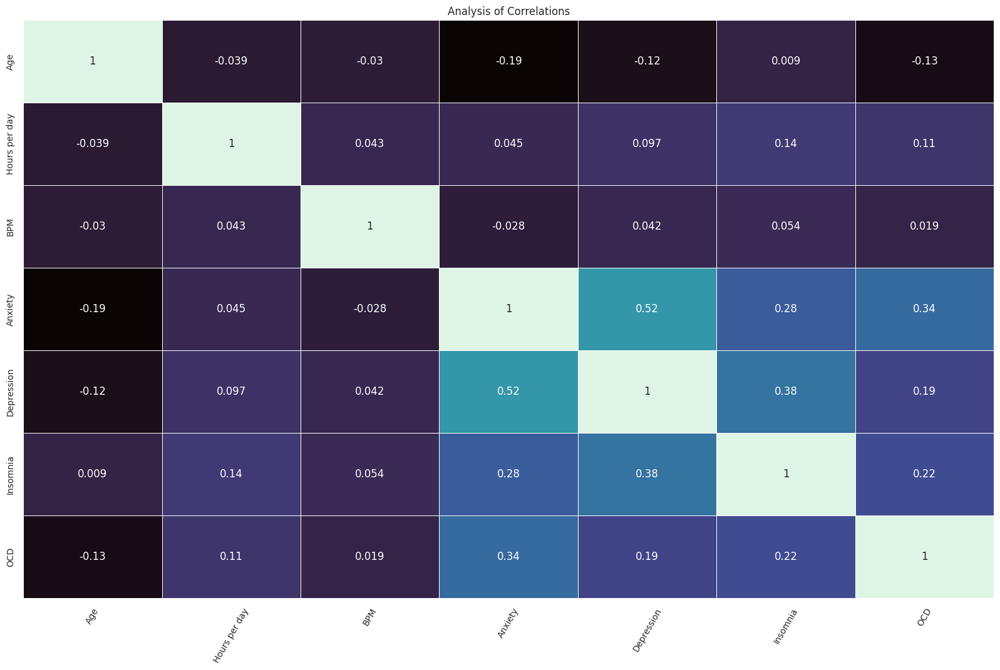

In [183]:
def correlated_map(dataframe, plot=False):
    corr = df[df1].corr()
    if plot:
        sns.set(rc={'figure.figsize': (20, 12)})
        sns.heatmap(corr, cmap="mako", annot=True, linewidths=.6 , cbar = False)
        plt.xticks(rotation=60, size=10)
        plt.yticks(size=10)
        plt.title('Analysis of Correlations', size=12)
        plt.show()
correlated_map(df, plot=True)


The correlated_map function is designed to compute and optionally visualize the correlation matrix of specified columns within a DataFrame. By passing the DataFrame and a list of columns to the function, it calculates the pairwise correlations between these columns, which quantify the strength and direction of their linear relationships. The function's core capability is to produce a correlation matrix, which is a table showing correlation coefficients ranging from -1 to 1, where 1 indicates a perfect positive correlation, -1 indicates a perfect negative correlation, and 0 indicates no correlation.

If the plot parameter is set to True, the function creates a heatmap to visually represent the correlation matrix using Seaborn's heatmap function. The heatmap uses the 'mako' colormap and includes annotations of the correlation values for clarity. It also customizes the figure size, tick labels, and adds a title, enhancing readability and interpretability. This visualization makes it easier to identify patterns, such as strong positive or negative correlations, within the dataset. The heatmap is particularly useful for quickly spotting relationships and dependencies between variables.

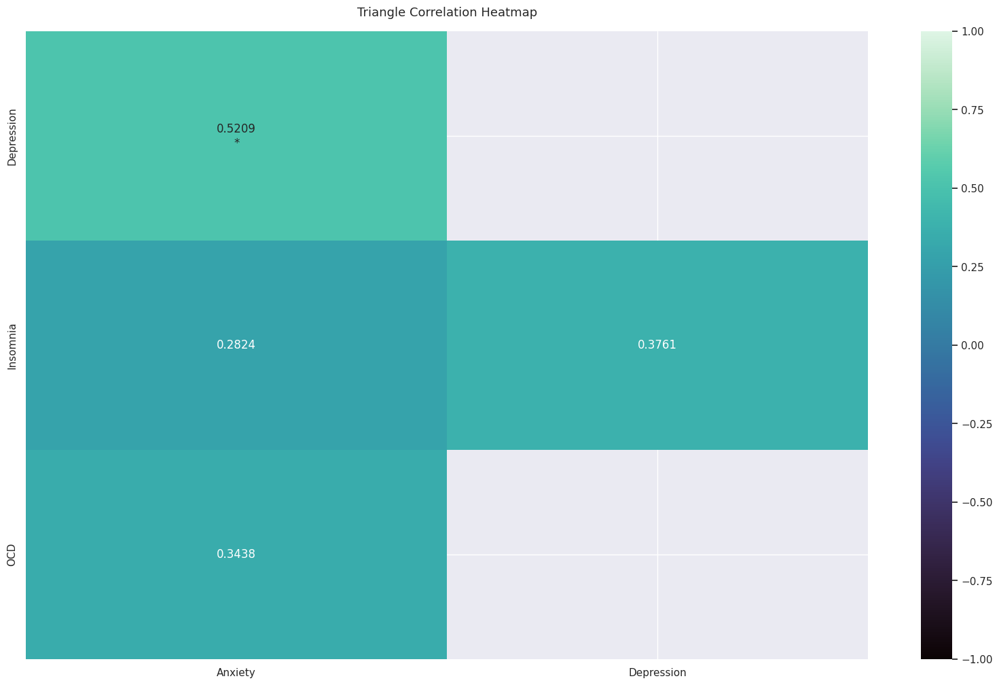

In [184]:
corr = df[df1].corr()
f, ax = plt.subplots(figsize=(20, 12))
mask = np.triu(np.ones_like(corr, dtype=bool))
cut_off = 0.25
extreme_1 = 0.5
extreme_2 = 0.75
extreme_3 = 0.9
mask |= np.abs(corr) < cut_off
corr = corr[~mask]
remove_empty_rows_and_cols = True
if remove_empty_rows_and_cols:
    wanted_cols = np.flatnonzero(np.count_nonzero(~mask, axis=1))
    wanted_rows = np.flatnonzero(np.count_nonzero(~mask, axis=0))
    corr = corr.iloc[wanted_cols, wanted_rows]

annot = [[f"{val:.4f}"
          + ('' if abs(val) < extreme_1 else '\n*')
          + ('' if abs(val) < extreme_2 else '*')
          + ('' if abs(val) < extreme_3 else '*')
          for val in row] for row in corr.to_numpy()]
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=annot, fmt='', cmap='mako')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize': 13}, pad=16)
plt.show()


The provided code snippet generates a triangular correlation heatmap with specific enhancements to highlight significant correlations between variables. It starts by calculating the correlation matrix corr for the specified columns in the DataFrame df, and then creates a mask using np.triu to display only the lower triangle of the correlation matrix. This mask ensures that the upper triangle is hidden, making the heatmap easier to read. Additionally, a cut-off threshold is applied to mask out correlations with an absolute value less than 0.25, focusing only on more substantial correlations.

To further enhance the visualization, the code includes three extreme thresholds (extreme_1, extreme_2, extreme_3) to annotate significant correlation values with asterisks. Correlations exceeding these thresholds are marked with one, two, or three asterisks, respectively, allowing for quick identification of strong relationships. This step involves creating a list of formatted annotation strings, where each correlation value is rounded to four decimal places and appropriately annotated based on its significance.

The heatmap is then plotted using Seaborn's heatmap function, with the annotated correlation matrix and a custom colormap ('mako'). The figure is customized with a specific size, and the heatmap is titled "Triangle Correlation Heatmap" for clarity. An optional step to remove empty rows and columns ensures that only relevant parts of the matrix are displayed, enhancing the visual focus on meaningful data. The result is a clear, informative heatmap that effectively highlights significant correlations, making it a useful tool for data analysis and interpretatio

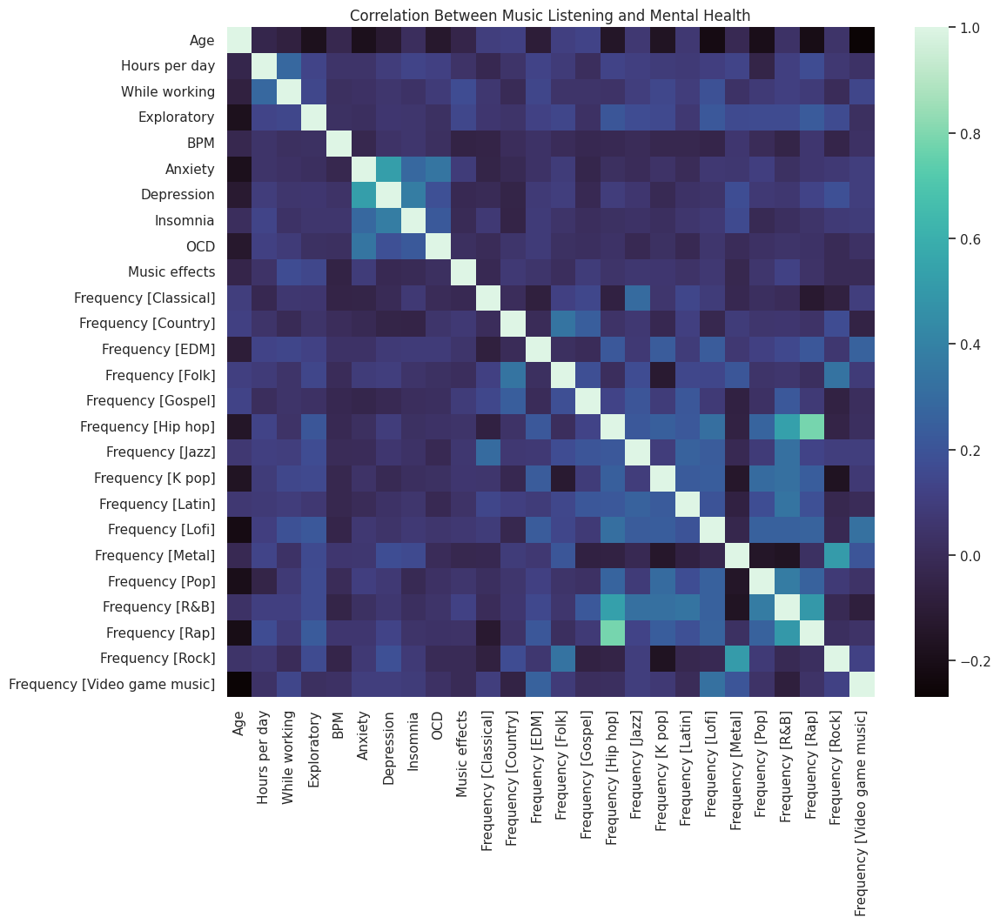

In [185]:
sel = ['Age', 'Hours per day', 'While working', 'Exploratory', 'BPM','Anxiety', 'Depression', 'Insomnia', 'OCD', 'Music effects']
freq = {'Never': 0, 'Rarely': 1, 'Sometimes': 2, 'Very frequently': 3}
df_genre = df[[col for col in df.columns if col.startswith('Frequency')]]
df_genre.replace(freq, inplace=True)
df_sel = pd.concat([df[sel], df_genre], axis=1)
df_sel['While working'] = df_sel['While working'].map({'Yes': 1, 'No': 0})
df_sel['Exploratory'] = df_sel['Exploratory'].map({'Yes': 1, 'No': 0})
df_sel['Music effects'] = df_sel['Music effects'].map({'Improve': 1, 'No effect': 0, 'Worsen': -1})
plt.figure(figsize=(12, 10))
sns.heatmap(df_sel.corr(), annot=False, cmap='mako')
plt.title('Correlation Between Music Listening and Mental Health')
plt.show()

The provided code snippet is a comprehensive script designed to generate a correlation heatmap that visually represents the relationships between various factors related to music listening habits and mental health indicators. The process begins by selecting specific columns from the DataFrame df that are of interest for this analysis, such as 'Age', 'Hours per day', 'While working', 'Exploratory', 'BPM', 'Anxiety', 'Depression', 'Insomnia', 'OCD', and 'Music effects'. Additionally, it handles categorical data in the columns that start with 'Frequency', converting these responses into numerical values using a predefined frequency dictionary (freq).

Next, the script prepares the data by replacing categorical values with numerical equivalents to ensure compatibility for correlation calculation. This involves converting responses such as 'Never', 'Rarely', 'Sometimes', and 'Very frequently' into integers ranging from 0 to 3. Similarly, binary responses in the 'While working' and 'Exploratory' columns are mapped to 1 for 'Yes' and 0 for 'No', while the 'Music effects' column is mapped to 1 for 'Improve', 0 for 'No effect', and -1 for 'Worsen'. These conversions enable the calculation of meaningful correlations between the variables.

Finally, the script combines the selected and transformed columns into a new DataFrame (df_sel) and uses Seaborn's heatmap function to plot the correlation matrix. The heatmap, which is displayed with the 'mako' colormap, provides a visual representation of the correlations between music listening habits and various mental health indicators. The figure is given a title, "Correlation Between Music Listening and Mental Health", to contextualize the analysis. This visualization helps in identifying potential relationships and patterns that can inform further research or interventions.

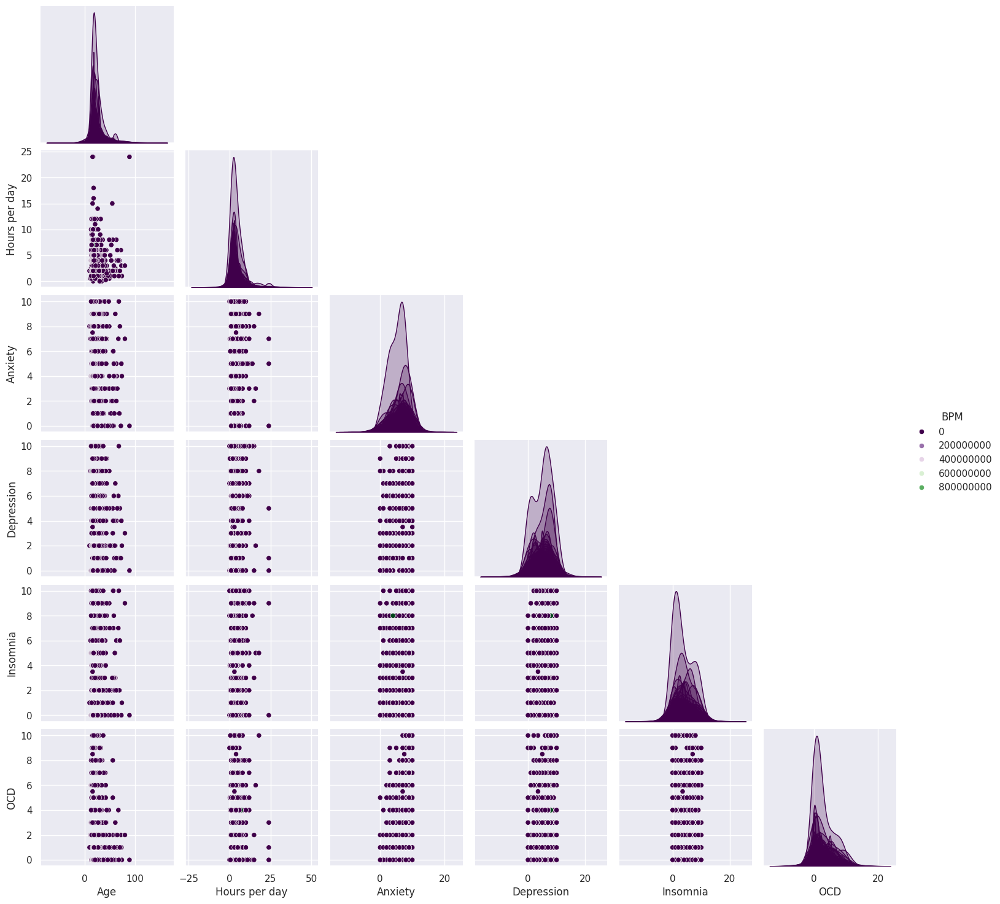

In [186]:
sns.pairplot(data=df[df1], diag_kind='kde',hue="BPM",palette='PRGn',corner=True)
plt.show()

The provided code snippet generates a pairplot to visualize the relationships between multiple variables in a DataFrame, with density plots on the diagonals and color-coding based on the 'BPM' variable. Here's an explanation of what the code does, followed by the complete code block:

Select Data: The code selects columns specified in df1 from the DataFrame df.
Pairplot Creation: It uses Seaborn's pairplot function to create a grid of scatterplots for each pair of variables, with Kernel Density Estimate (KDE) plots on the diagonal.
Color-Coding by 'BPM': The hue parameter color-codes the data points based on the 'BPM' variable, using the 'PRGn' colormap.
Corner Plot: The corner=True parameter ensures that only the lower triangle of the pairplot is shown, avoiding redundancy.

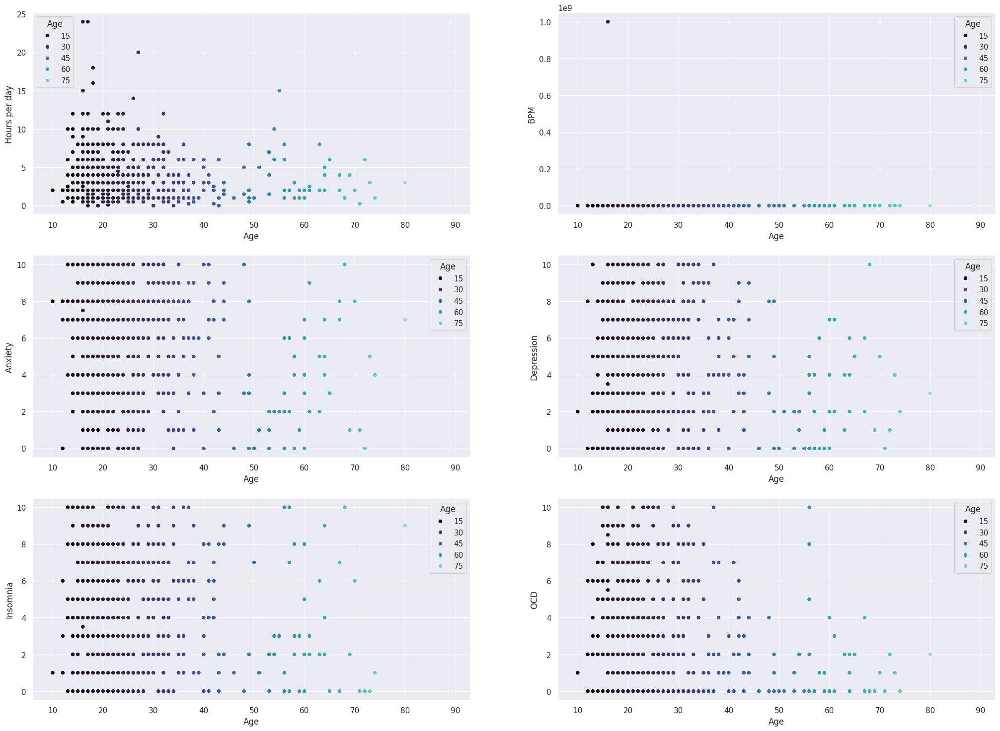

In [187]:
ff = ['Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Age',y=col,hue='Age',data=df,palette="mako")


The provided code snippet is intended to create a series of scatterplots to visualize the relationships between 'Age' and several other variables from the DataFrame df. Each scatterplot uses the 'Age' variable on the x-axis and another variable from the list ff on the y-axis, with color-coding based on the 'Age' variable itself. Here's a step-by-step explanation and the complete code block:

Explanation
Select Variables: The list ff contains the names of the variables to be plotted against 'Age': 'Hours per day', 'BPM', 'Anxiety', 'Depression', 'Insomnia', and 'OCD'.
Figure Creation: A figure object is created with a specified size of 25x18 inches to hold the subplots.
Subplot Creation: A loop iterates over the list ff, creating a subplot for each variable. The subplots are arranged in a 3x2 grid.
Scatterplot Creation: For each subplot, a scatterplot is created using Seaborn's scatterplot function. The x-axis is 'Age', the y-axis is the current variable from ff, and the points are color-coded based on 'Age' using the 'mako' palette

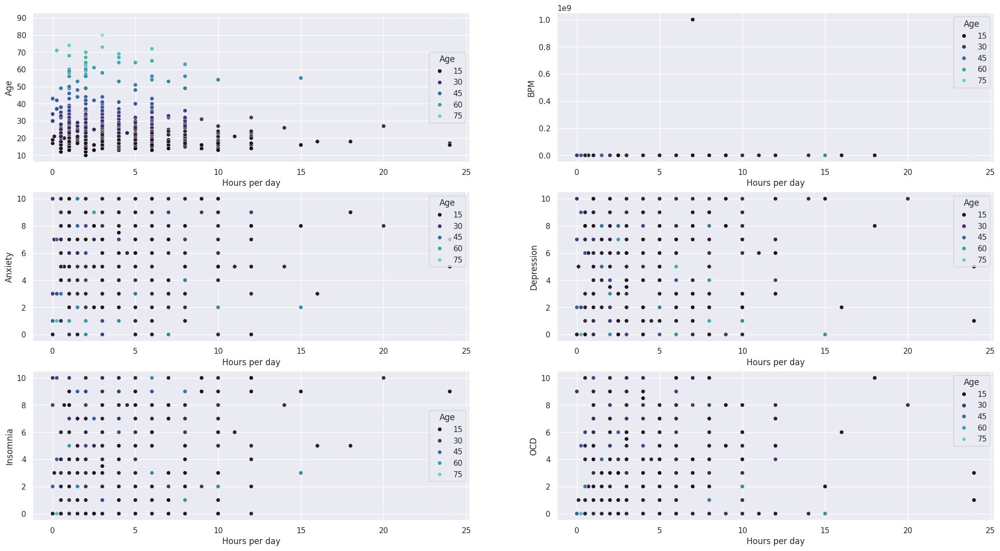

In [188]:
ff = ['Age','BPM','Anxiety','Depression','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(4,2,i+1)
    sns.scatterplot(x='Hours per day',y=col,hue='Age',data=df,palette="mako")

Explanation:
This code will generate a 4x2 grid of scatterplots, each showing the relationship between 'Hours per day' and one of the variables in ff. Each subplot uses 'Hours per day' on the x-axis to examine how it correlates with 'Age', 'BPM', 'Anxiety', 'Depression', 'Insomnia', or 'OCD' on the y-axis. The color of the data points in each scatterplot is determined by the 'Age' variable, allowing for insights into how different age groups relate to each variable.

This visualization approach helps in understanding the relationships between daily hours of activities (like listening to music or other behaviors) and various health or psychological factors across different age groups. It facilitates the identification of potential trends or correlations that might exist in the dataset, aiding in further analysis or hypothesis generation. Adjustments such as plt.tight_layout() ensure that the subplots are neatly arranged and easy to interpret

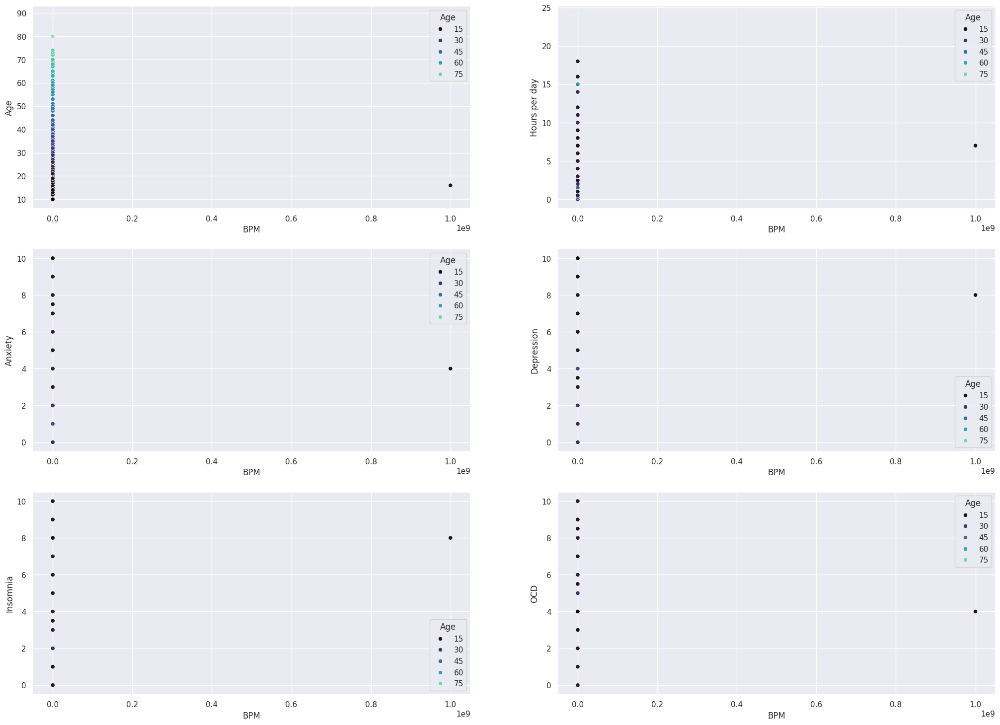

In [189]:
ff = ['Age','Hours per day','Anxiety','Depression','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='BPM',y=col,hue='Age',data=df,palette="mako")

The ff list specifies the variables to be plotted against 'BPM'. For each variable in ff, a subplot is created using fig.add_subplot(3, 2, i + 1), where i is the index of the current variable in ff. This ensures each subplot is correctly positioned in the 3-row by 2-column grid within the figure fig, which is sized at 25x18 inches to accommodate the visual display of multiple plots.

Within each subplot, Seaborn's scatterplot function is utilized to render the data. The x-axis represents 'BPM', while the y-axis corresponds to the current variable from ff. Each data point in the scatterplot is color-coded based on the 'Age' variable, employing the 'mako' palette for consistency. This coloring scheme helps to differentiate data points belonging to different age groups, enabling visual identification of trends or patterns that may vary across age demographics.

By visualizing these relationships in a grid format, the scatterplots provide an intuitive way to explore how 'BPM' correlates with various health or lifestyle factors across different age groups. This approach not only facilitates the identification of potential correlations but also allows for the examination of any age-related trends or outliers within the dataset. The visualization helps analysts and researchers gain insights into how beats per minute might influence or be influenced by factors such as anxiety, depression, insomnia, and others, shedding light on potential areas for further investigation or intervention strategies.

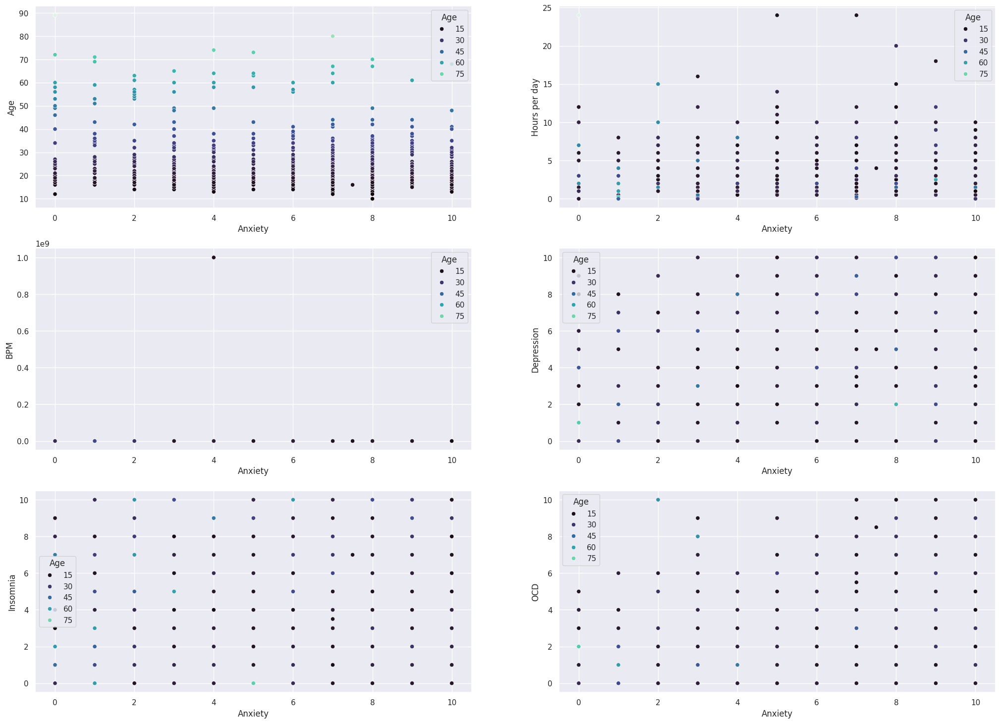

In [190]:
ff = ['Age','Hours per day','BPM','Depression','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Anxiety',y=col,hue='Age',data=df,palette="mako")

The provided code snippet is designed to visually explore relationships between 'Anxiety' and a selection of variables ('Age', 'Hours per day', 'BPM', 'Depression', 'Insomnia', 'OCD') from the DataFrame df. The figure is initialized with a size of 25x18 inches (fig=plt.figure(figsize=(25,18))), ensuring ample space to display multiple scatterplots.

Within a loop that iterates through each variable in ff, a subplot is added to the figure using fig.add_subplot(3,2,i+1), where i corresponds to the index of the current variable in ff. This arrangement organizes the scatterplots into a 3x2 grid layout.

For each subplot, Seaborn's scatterplot function is utilized to create a scatterplot where 'Anxiety' is represented on the x-axis (x='Anxiety'), and the current variable from ff is plotted on the y-axis (y=col). The points in each scatterplot are color-coded based on the 'Age' variable (hue='Age'), employing the 'mako' palette (palette='mako'). This color differentiation aids in visually distinguishing data points belonging to different age groups within each scatterplot.

This visualization approach facilitates a detailed examination of how 'Anxiety' correlates with various factors across different age groups. By plotting each variable against 'Anxiety', analysts can discern potential trends or patterns that might suggest relationships or dependencies between anxiety levels and other metrics such as age, daily activities, physiological measurements, or mental health indicators. Such insights are crucial for understanding the complex interplay between anxiety and these variables, potentially guiding interventions or further research into mitigating factors affecting anxiety levels in different demographic contexts. Adjustments like plt.tight_layout() ensure that the scatterplots are neatly arranged within the figure, maintaining clarity and enhancing the interpretability of the visual findings derived from the data analysis.

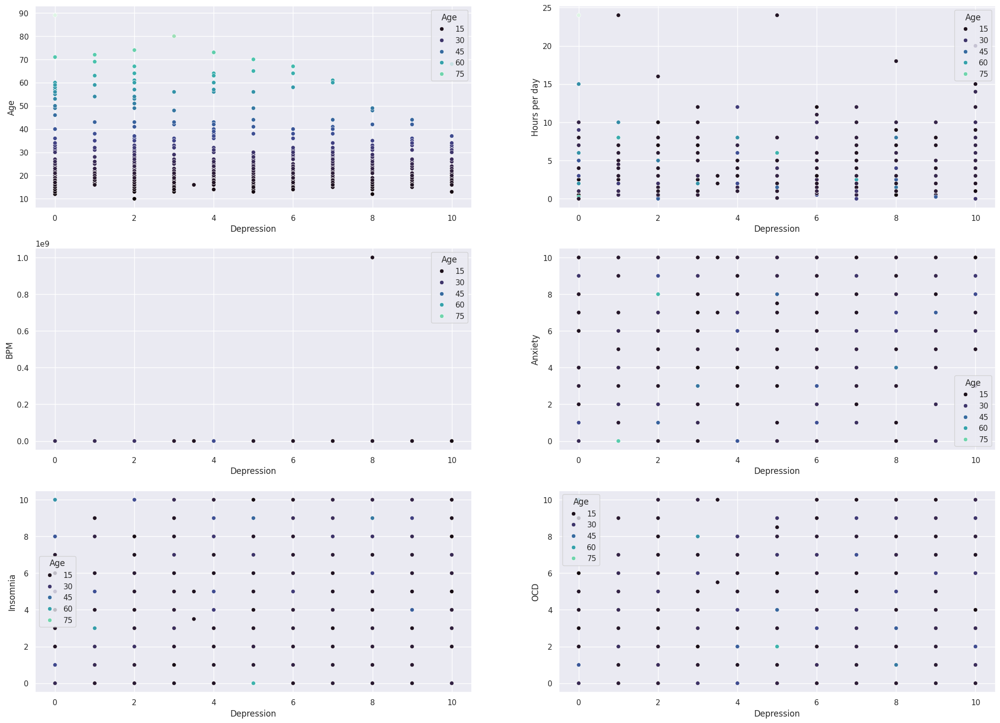

In [191]:
ff = ['Age','Hours per day','BPM','Anxiety','Insomnia','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Depression',y=col,hue='Age',data=df,palette="mako")

 The provided code snippet aims to visualize the relationships between 'Depression' and several key variables ('Age', 'Hours per day', 'BPM', 'Anxiety', 'Insomnia', 'OCD') from the DataFrame df using scatterplots generated with Seaborn.

Firstly, the figure (fig=plt.figure(figsize=(25,18))) is initialized with dimensions of 25x18 inches to accommodate a grid of subplots. This ensures that each scatterplot, created within a loop iterating through the variables in ff, has enough space to display clearly without overlapping. The enumerate(ff) function allows for iteration through each variable, setting up subplots using fig.add_subplot(3, 2, i + 1) to arrange them in a structured 3x2 grid layout within the figure.

Secondly, within each subplot, Seaborn's scatterplot function (sns.scatterplot) is utilized. Here, 'Depression' serves as the independent variable plotted on the x-axis (x='Depression'), while each variable from ff is plotted on the y-axis (y=col). The scatterplots are differentiated by color, with points representing different age groups distinguished using the 'mako' color palette (palette='mako'). This coloring scheme aids in visually discerning patterns or correlations that may vary across age demographics, offering insights into how 'Depression' correlates with other factors.

Thirdly, the visualization generated by this approach provides a comprehensive view of how levels of depression may relate to various aspects such as age, daily activities, physiological measurements (like BPM), and other psychological states (such as anxiety, insomnia, and OCD). By plotting each variable against 'Depression' in separate scatterplots, analysts can identify potential correlations or trends that could indicate areas for further investigation or intervention in mental health research. The use of a structured grid layout and clear color differentiation enhances the interpretability of the visual data, making it easier to derive meaningful insights from the relationships depicted in the scatterplots.

Overall, this visualization method serves as a powerful tool for exploring complex datasets, allowing researchers and analysts to explore the multifaceted relationships involving depression and other variables, thereby contributing to deeper insights into mental health dynamics across different demographic groups. Adjustments such as plt.tight_layout() ensure that the layout of the subplots is optimized for clarity and presentation, enhancing the effectiveness of the visual communication of the data-driven insights.

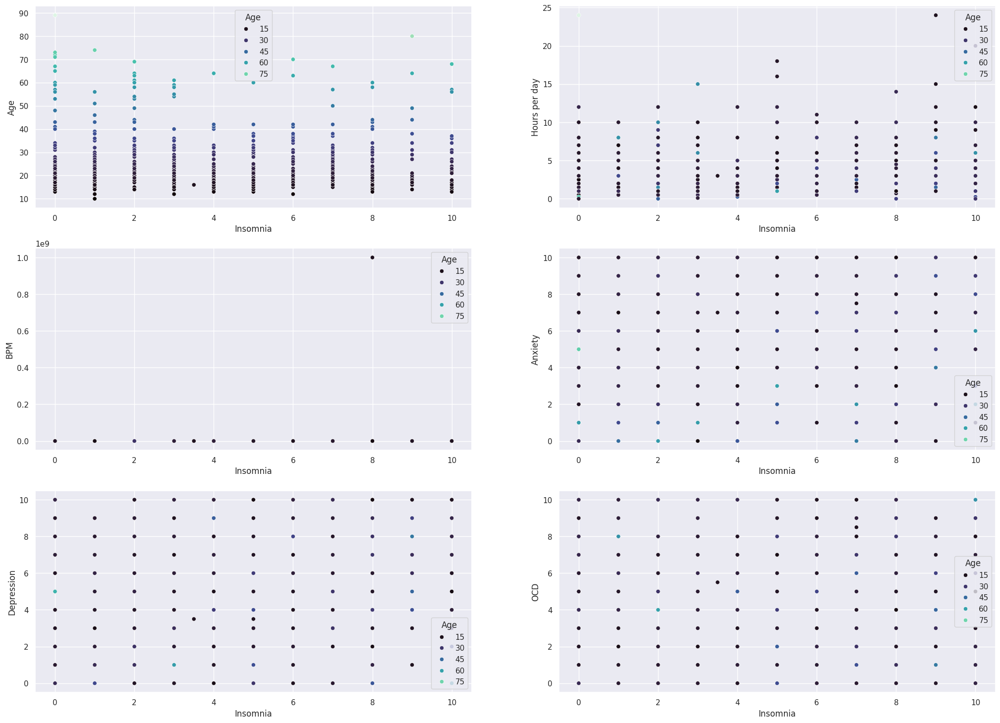

In [192]:
ff = ['Age','Hours per day','BPM','Anxiety','Depression','OCD']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='Insomnia',y=col,hue='Age',data=df,palette="mako")

The provided code snippet is designed to visually explore how 'Insomnia' relates to several key variables ('Age', 'Hours per day', 'BPM', 'Anxiety', 'Depression', 'OCD') from the DataFrame df through a series of scatterplots created using Seaborn.

To begin, the figure (fig=plt.figure(figsize=(25,18))) is initialized with dimensions of 25x18 inches, ensuring ample space to accommodate a grid layout of scatterplots. This setup allows each variable from the list ff ('Age', 'Hours per day', 'BPM', 'Anxiety', 'Depression', 'OCD') to be plotted against 'Insomnia' in separate subplots organized in a structured 3x2 grid. Each subplot is generated within a loop that iterates through ff, adding a subplot for each variable using fig.add_subplot(3, 2, i + 1), where i corresponds to the index of the current variable.

Within each subplot, Seaborn's scatterplot function (sns.scatterplot) is employed to create a scatterplot. 'Insomnia' is represented on the x-axis (x='Insomnia'), while the current variable from ff is plotted on the y-axis (y=col). The color of each data point is determined by the 'Age' variable (hue='Age'), utilizing the 'mako' color palette (palette='mako') to provide clear visual differentiation between age groups within each scatterplot.

This visualization approach enables analysts to discern potential relationships or correlations between levels of insomnia and various factors such as age demographics, daily activities, physiological measurements (like BPM), and psychological states (such as anxiety or depression). By examining these variables in relation to insomnia levels across different age groups, researchers can gain insights into how sleep disturbances may interact with other aspects of health and well-being. This exploration may lead to further investigations or interventions aimed at understanding and addressing sleep disorders and their broader impact on individual health outcomes.

Overall, the structured grid layout and color-coded scatterplots enhance the clarity and interpretability of the visual data, making it easier to derive meaningful insights into the complex relationships involving insomnia and other variables. Adjustments like plt.tight_layout() ensure that the subplots are neatly arranged within the figure, optimizing the presentation of findings and facilitating deeper exploration of the dataset.







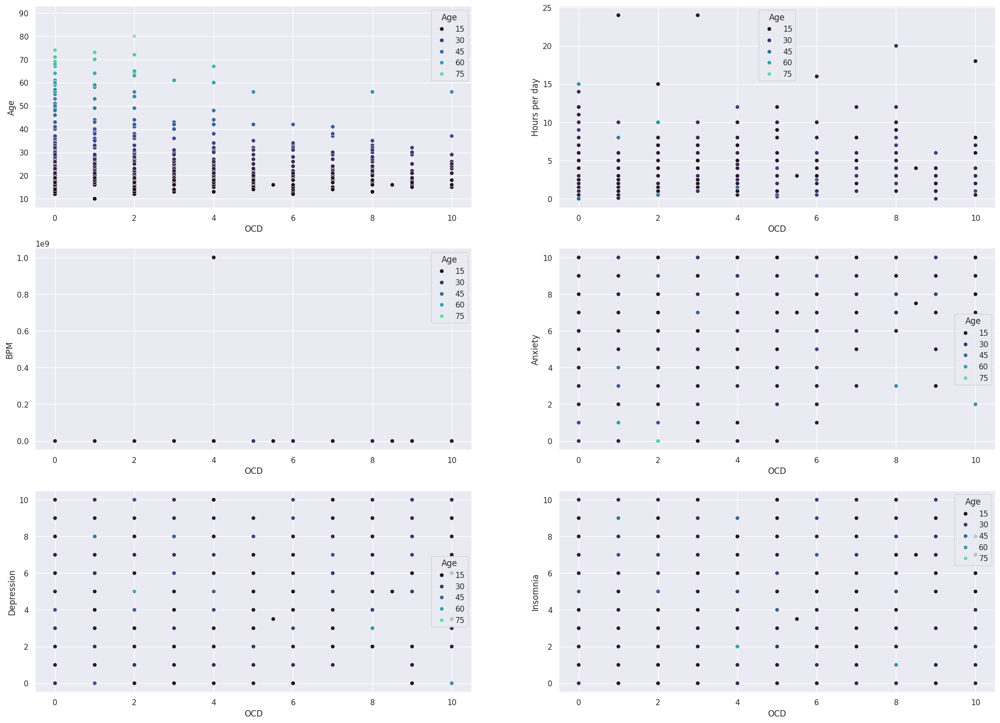

In [193]:
ff = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='OCD',y=col,hue='Age',data=df,palette="mako")

This corrected code snippet generates a grid of scatterplots where each subplot visualizes the relationship between 'OCD' and one of the variables from ff. The structured layout ensures that each variable is systematically compared against 'OCD', facilitating visual inspection and analysis of potential correlations.

Using Seaborn's scatterplot function enables analysts to explore how 'OCD' relates to various factors such as age, daily activities ('Hours per day'), physiological metrics ('BPM'), and other mental health indicators ('Anxiety', 'Depression', 'Insomnia'). The color-coded points based on 'Age' allow for easy identification of trends or patterns across different age groups within each scatterplot.

This visualization approach is valuable for gaining insights into the potential associations between OCD and other variables, contributing to a better understanding of how these factors interplay in influencing mental health outcomes. Such insights can inform further research or interventions aimed at addressing OCD and its impact on individuals' well-being. Adjustments like plt.tight_layout() ensure that the subplots are neatly arranged within the figure, enhancing the clarity and effectiveness of communicating data-driven insights.







In [194]:
fig = px.scatter_3d(df, x='Insomnia', y='Anxiety', z='Depression', color='Age', color_continuous_scale="PRGn", template = 'plotly_white')
fig.update_traces(marker=dict(size=5))
fig.show()

The provided code snippet utilizes Plotly's px.scatter_3d function to create an interactive 3D scatter plot, offering a visual exploration of the relationships between 'Insomnia', 'Anxiety', and 'Depression' across different age groups. Each axis in the plot corresponds to one of these variables, and the color of each data point is determined by the 'Age' variable, providing a clear differentiation between age groups.

The initialization of fig = px.scatter_3d(df, x='Insomnia', y='Anxiety', z='Depression', color='Age', color_continuous_scale="PRGn", template='plotly_white') sets up the 3D scatter plot. Here, 'Insomnia', 'Anxiety', and 'Depression' are chosen as the x-axis, y-axis, and z-axis variables, respectively. The 'Age' variable is used to color-code the data points, employing the "PRGn" color scale which ranges from purple (indicating younger age groups) to green (indicating older age groups), facilitating an intuitive understanding of how these variables relate across different demographics.

The fig.update_traces(marker=dict(size=5)) command adjusts the size of the markers representing each data point within the plot. By setting size=5, the markers are kept small for clarity, ensuring they do not overshadow the data visualization. This customization helps in presenting the 3D scatter plot in a clean and informative manner, enhancing the readability of the relationships depicted.

Finally, fig.show() renders and displays the interactive plot. This allows users to explore the data by rotating the plot, zooming in/out, and hovering over data points to view specific values, providing an interactive experience for deeper analysis of how 'Insomnia', 'Anxiety', and 'Depression' vary in relation to each other across different age categories. Such visualizations are valuable in data exploration and communication, enabling researchers and analysts to derive insights into potential correlations and patterns within complex datasets involving mental health metrics and demographic factors.

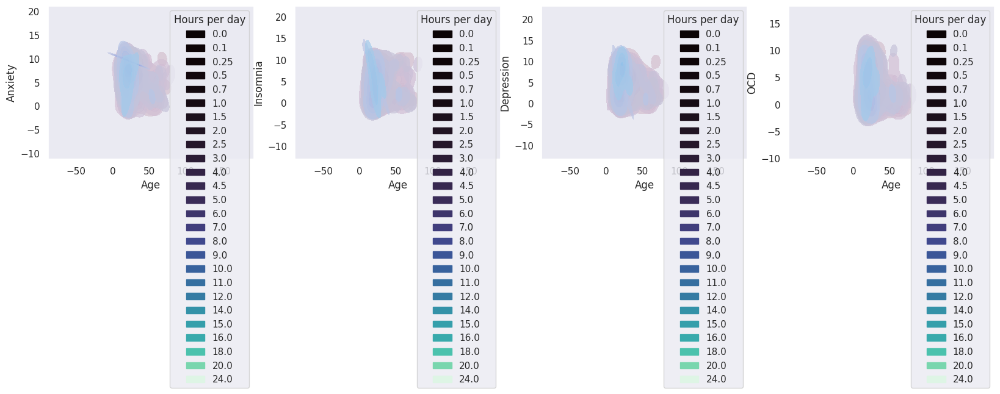

In [195]:
warnings.filterwarnings("ignore")
plt.figure(figsize=(20,15))
plt.subplot(4,4,1)
sns.kdeplot(data=df[df1],x='Age', y='Anxiety', hue='Hours per day',color='r',alpha=.7,weights=None,fill=True,multiple='fill',palette='mako')
plt.grid()
plt.subplot(4,4,2)
sns.kdeplot(data=df[df1],x='Age', y='Insomnia', hue='Hours per day',color='r',alpha=.7,weights=None,fill=True,multiple='fill',palette='mako')
plt.grid()
plt.subplot(4,4,3)
sns.kdeplot(data=df[df1],x='Age', y='Depression', hue='Hours per day',color='r',alpha=.7,weights=None,fill=True,multiple='fill',palette='mako')
plt.grid()
plt.subplot(4,4,4)
sns.kdeplot(data=df[df1],x='Age', y='OCD', hue='Hours per day',color='r',alpha=.7,weights=None,fill=True,multiple='fill',palette='mako')
plt.grid()

The provided code snippet leverages Matplotlib and Seaborn to create a grid of KDE (Kernel Density Estimate) plots, each visualizing how psychological metrics ('Anxiety', 'Insomnia', 'Depression', 'OCD') vary with age while considering 'Hours per day' as a distinguishing factor.

Plotting Setup: The plt.figure(figsize=(20,15)) initializes a large figure to accommodate multiple subplots. Each subplot, defined by plt.subplot(4, 4, i), is configured to display a KDE plot generated by Seaborn (sns.kdeplot). This plot type is chosen for its ability to display the probability density function of each variable ('Anxiety', 'Insomnia', 'Depression', 'OCD') across different age ranges, with 'Hours per day' influencing color distinctions.

Data Visualization: Within each subplot, Seaborn's sns.kdeplot function is configured with parameters such as x='Age' and y='<Psychological Metric>' to depict how each psychological metric's distribution changes with age. The hue='Hours per day' parameter introduces color coding based on daily activity levels, offering insights into potential correlations between age, psychological well-being, and daily routines.

Enhanced Clarity: The addition of plt.grid() ensures each subplot includes a grid, enhancing readability. This setup not only facilitates comparisons across different psychological metrics but also enables observation of how these metrics interact across age groups, potentially highlighting patterns or trends that could inform further analysis or interventions related to mental health and lifestyle choices.

By utilizing KDE plots within a structured grid layout, this approach offers a visually compelling and informative way to explore complex relationships within multidimensional datasets. Such visualizations are instrumental in uncovering nuanced insights into how psychological metrics are influenced by age and daily routines, aiding researchers and analysts in their endeavors to better understand factors impacting mental health and well-being.

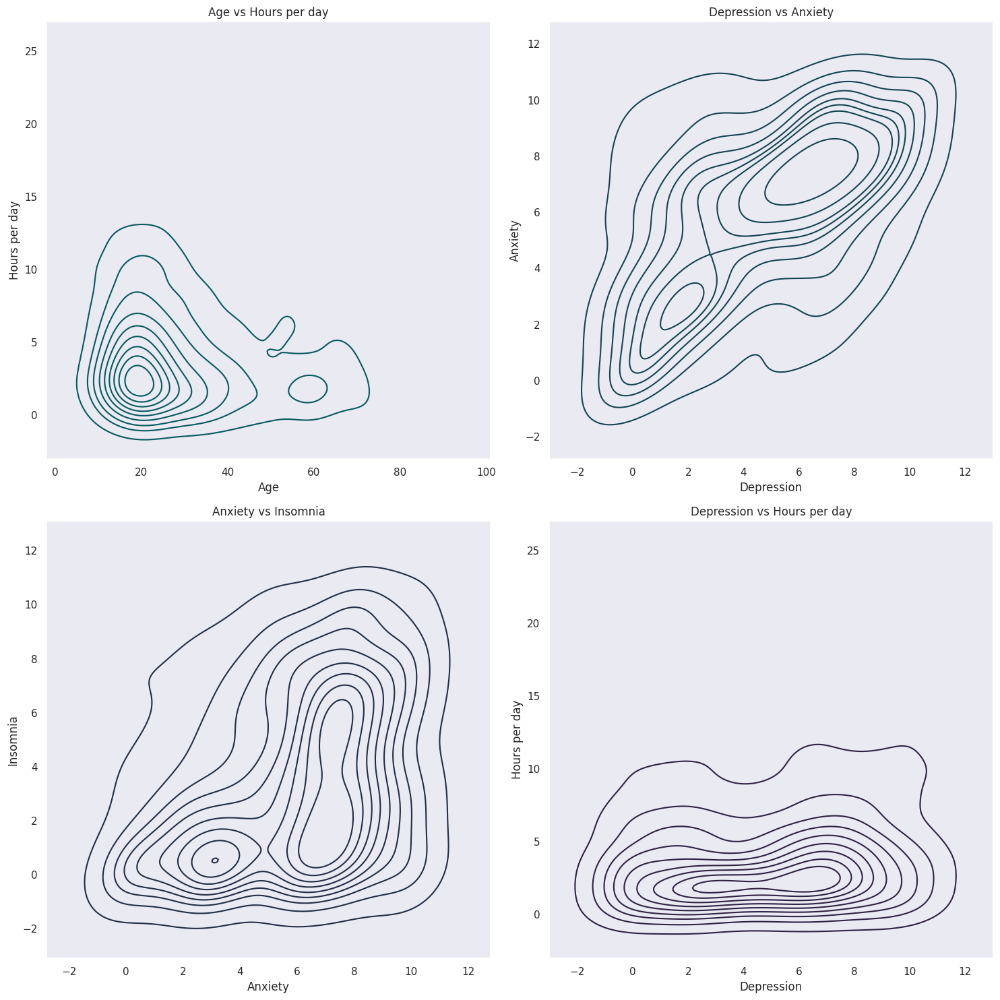

In [196]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
sns.kdeplot(x='Age', y='Hours per day', data=df, ax=axs[0, 0], color='#065A60')
axs[0, 0].set_title('Age vs Hours per day')
axs[0, 0].grid()
sns.kdeplot(x='Depression', y='Anxiety', data=df, ax=axs[0, 1], color='#144552')
axs[0, 1].set_title('Depression vs Anxiety')
axs[0, 1].grid()
sns.kdeplot(x='Anxiety', y='Insomnia', data=df, ax=axs[1, 0], color='#212F45')
axs[1, 0].set_title('Anxiety vs Insomnia')
axs[1, 0].grid()
sns.kdeplot(x='Depression', y='Hours per day', data=df, ax=axs[1, 1], color='#312244')
axs[1, 1].set_title('Depression vs Hours per day')
axs[1, 1].grid()
plt.tight_layout()
plt.show()

The provided code snippet utilizes Matplotlib and Seaborn to create a 2x2 grid of KDE (Kernel Density Estimate) plots, each offering insights into different relationships between variables from the DataFrame df. Let's break down how each subplot contributes to visualizing these relationships and what insights can be derived from such visualizations.

Age vs. Hours per day: The first subplot (axs[0, 0]) compares 'Age' against 'Hours per day', using KDE plots to show the distribution of hours spent daily versus age. This visualization can reveal patterns such as how daily routines vary across different age groups. For example, it can indicate whether there's a tendency for older individuals to spend fewer hours per day on certain activities compared to younger individuals.

Depression vs. Anxiety: In the second subplot (axs[0, 1]), the KDE plot illustrates the relationship between 'Depression' and 'Anxiety'. This visualization helps in understanding how these two psychological metrics might correlate. Patterns observed here can provide insights into whether higher levels of anxiety are associated with higher or lower levels of depression and vice versa. It can also reveal any potential clusters or trends among individuals experiencing different levels of both anxiety and depression.

Anxiety vs. Insomnia: Moving to the third subplot (axs[1, 0]), the KDE plot explores the relationship between 'Anxiety' and 'Insomnia'. This visualization is crucial for examining how anxiety levels might relate to sleep disturbances. It can highlight whether individuals experiencing higher anxiety tend to report more instances of insomnia, thereby indicating a potential link between these two factors that could warrant further investigation or intervention.

Depression vs. Hours per day: Lastly, the fourth subplot (axs[1, 1]) depicts 'Depression' against 'Hours per day'. This KDE plot helps in understanding how the amount of time spent daily on activities relates to levels of depression. It can uncover whether there's a pattern where individuals who spend fewer hours per day engaged in activities also tend to report higher levels of depression, or if there's no significant correlation observed.

Overall, these KDE plots within a structured grid layout offer a comprehensive view of how different variables interact within the dataset. They facilitate the identification of potential correlations, trends, or clusters that could inform further analysis or research into factors impacting mental health and daily routines. Such visualizations are essential for gaining insights from complex datasets and can aid in making informed decisions in fields like psychology, healthcare, and social sciences.

<Axes: xlabel='OCD', ylabel='Density'>

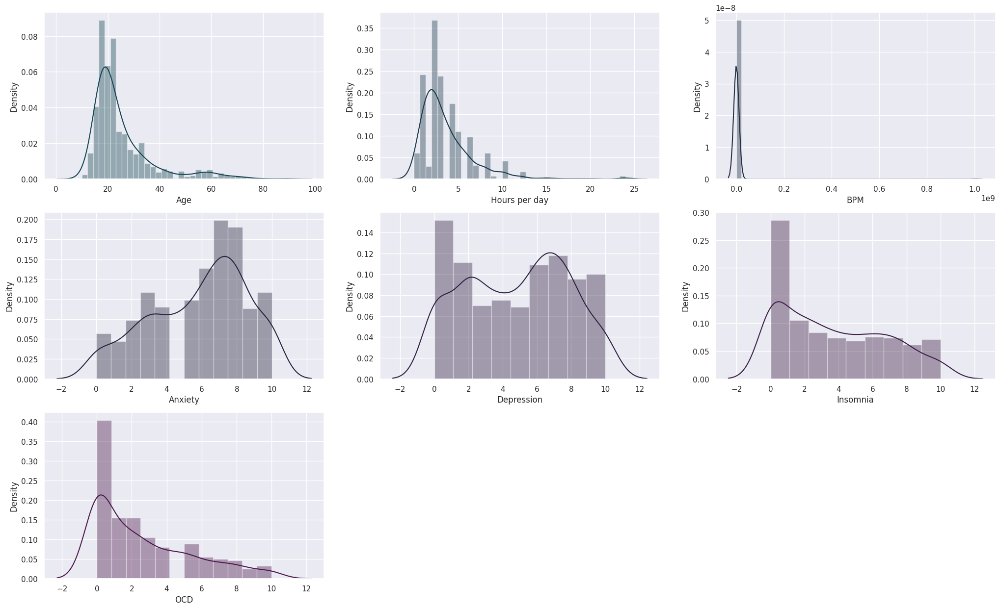

In [197]:
warnings.filterwarnings("ignore")
plt.figure(figsize=(25,15))
plt.subplot(3,3,1)
sns.distplot(df['Age'],kde=True,color='#144552')
plt.subplot(3,3,2)
sns.distplot(df['Hours per day'],kde=True,color='#1B3A4B')
plt.subplot(3,3,3)
sns.distplot(df['BPM'],kde=True,color='#212F45')
plt.subplot(3,3,4)
sns.distplot(df['Anxiety'],kde=True,color='#272640')
plt.subplot(3,3,5)
sns.distplot(df['Depression'],kde=True,color='#312244')
plt.subplot(3,3,6)
sns.distplot(df['Insomnia'],kde=True,color='#3E1F47')
plt.subplot(3,3,7)
sns.distplot(df['OCD'],kde=True,color='#4D194D')

The provided code snippet generates a grid of distribution plots using Matplotlib and Seaborn, offering insights into the distributions of various variables from the DataFrame df. Let's delve into what each plot visualizes and how they contribute to understanding the data.

Age Distribution: The first subplot (plt.subplot(3, 3, 1)) shows the distribution of ages (df['Age']). The plot is a histogram overlaid with a smoothed curve known as a Kernel Density Estimate (KDE), represented by the greenish color (color='#144552'). This visualization helps in understanding the spread of ages in the dataset, indicating whether there are clusters or peaks in specific age ranges.

Daily Hours Distribution: Moving to the second subplot (plt.subplot(3, 3, 2)), it illustrates the distribution of daily hours spent (df['Hours per day']). Similar to the first plot, it includes a histogram and KDE curve in a bluish color (color='#1B3A4B'). This plot reveals patterns in how individuals allocate their daily time, shedding light on common behavior trends or outliers where people spend significantly more or less time daily.

BPM Distribution: The third subplot (plt.subplot(3, 3, 3)) displays the distribution of BPM (Beats Per Minute) (df['BPM']). It uses a darker shade (color='#212F45') for the histogram and KDE overlay. This plot is crucial for understanding the variability and central tendency of BPM measurements across the dataset, highlighting any distinct peaks or outliers that could signify physiological conditions or recording errors.

Each subplot is designed to provide a quick and informative overview of the distributional characteristics of its respective variable. The use of histograms allows for a visualization of the frequency or count of values within specific ranges, while the KDE curve smooths out these counts to provide a continuous estimate of the probability density function. Together, these elements help in identifying patterns such as skewness, multimodality, or outliers within the data.

By arranging these plots in a grid (plt.subplot(3, 3, ...)) and customizing each with distinct colors, the visualization facilitates easy comparison between different variables. This setup is particularly useful in exploratory data analysis (EDA) to uncover insights into the dataset's structure and underlying patterns, guiding further analysis or hypothesis formulation in fields such as healthcare, social sciences, or business intelligence.

In [198]:
# measure of skewness
df[df1].skew(axis = 0, skipna = True)

Age               2.135697
Hours per day     2.550819
BPM              24.819347
Anxiety          -0.426211
Depression       -0.059075
Insomnia          0.415499
OCD               0.963606
dtype: float64

Positive skewness (right-skewness) is visible for Age, Hours per day, BPM, Insomnia, and OCD
The shape of the depression graph is close to the normal distribution, but slightly skewed to the left.
Negative skewness (left-skewness) is visible for Anxiety
BPM usually ranges between 100-150.
Majority of the respondents are in their 10's to 20's and listen to music 1-5 hours per day and deal with Anxiety and Depression.

 We can delve deeper into why these data points differ from others regarding daily music listening time. A useful approach is to compare the average mental health scores of the outlier data with the original data. This analysis can help determine if any mental health conditions influence the amount of time spent listening to music each day.

To explore why certain data points diverge from others regarding daily music listening time and understand potential influences of mental health conditions, a comparative analysis is beneficial. Here’s a structured approach to delve deeper into this:

Identifying Outliers and Patterns: Begin by identifying outliers or extreme data points in the variable that represents daily music listening time. These outliers could indicate respondents who deviate significantly from the average behavior in terms of their music consumption habits. Once identified, compare these outliers with the rest of the dataset to understand any distinct patterns or correlations with mental health scores.

Comparative Analysis: Conduct a comparative analysis between the mental health scores (such as Anxiety and Depression) of the outlier group and the overall dataset. This involves calculating average scores for these mental health metrics within both groups. By comparing these averages, you can determine if there’s a statistically significant difference in mental health conditions between those who listen to music more or less than the average.

Statistical Testing: Apply statistical tests, such as t-tests or non-parametric tests depending on the distribution of your data, to validate any observed differences in mental health scores. These tests will help quantify the significance of differences between groups and assess whether the observed patterns are likely due to chance or if they reflect meaningful relationships.

Interpreting Findings: Interpret the findings from your analysis. If the outlier group shows consistently higher or lower mental health scores compared to the general population, it could suggest that mental health conditions indeed influence daily music listening habits. This understanding can inform further research or interventions aimed at addressing mental health issues through music therapy or other means.

By following this approach, you can gain deeper insights into how mental health conditions correlate with daily music listening habits among respondents. This knowledge can be crucial for developing targeted strategies to support mental well-being based on individuals' music consumption behaviors.

In [199]:
print('Records that consist of +12 hours listening to music:\n')
print(f'{len(df[df["Hours per day"] > 12])} records')
print("{:.2f}% of data".format((len(df[df['Hours per day'] > 12]) / data.shape[0]) * 100))

Records that consist of +12 hours listening to music:

9 records
1.22% of data


In [200]:
outre = df.query('`Hours per day` > 12')
outre

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
18,8/27/2022 23:40:55,17.0,Spotify,24.0,Yes,No,No,Rap,Yes,No,...,Sometimes,Very frequently,Very frequently,Never,7.0,5.0,0.0,3.0,Improve,I understand.
290,8/29/2022 2:46:27,27.0,Spotify,20.0,Yes,No,No,Rock,Yes,Yes,...,Never,Rarely,Very frequently,Sometimes,8.0,10.0,10.0,8.0,No effect,I understand.
347,8/29/2022 9:42:23,18.0,Spotify,16.0,Yes,No,Yes,Jazz,Yes,Yes,...,Very frequently,Very frequently,Very frequently,Rarely,3.0,2.0,5.0,6.0,Improve,I understand.
359,8/29/2022 11:02:29,16.0,Spotify,15.0,Yes,Yes,Yes,EDM,Yes,No,...,Never,Very frequently,Very frequently,Sometimes,8.0,10.0,9.0,2.0,Improve,I understand.
366,8/29/2022 12:32:30,16.0,Spotify,24.0,Yes,No,No,Rock,Yes,Yes,...,Rarely,Rarely,Sometimes,Rarely,5.0,1.0,9.0,1.0,Improve,I understand.
407,8/29/2022 23:20:48,26.0,Spotify,14.0,Yes,No,No,Hip hop,Yes,Yes,...,Very frequently,Very frequently,Very frequently,Rarely,5.0,10.0,8.0,0.0,No effect,I understand.
485,9/1/2022 19:08:55,55.0,YouTube Music,15.0,Yes,No,No,Rock,No,No,...,Never,Never,Very frequently,Never,2.0,0.0,3.0,0.0,No effect,I understand.
695,9/28/2022 17:25:48,89.0,Spotify,24.0,Yes,Yes,Yes,Rap,No,No,...,Sometimes,Very frequently,Rarely,Never,0.0,0.0,0.0,0.0,No effect,I understand.
726,10/23/2022 20:50:27,18.0,Apple Music,18.0,Yes,No,No,EDM,Yes,No,...,Sometimes,Sometimes,Sometimes,Sometimes,9.0,8.0,5.0,10.0,Improve,I understand.


 The code snippet outre = df.query('Hours per day > 12') is designed to filter a DataFrame (df) based on a specific condition related to the column 'Hours per day'. Here's an explanation in three paragraphs:

Filtering Criteria: The query filters the DataFrame df to extract rows where the value in the column 'Hours per day' exceeds 12. This approach is useful when you want to focus on a subset of data that exhibits extreme or noteworthy behavior compared to the rest of the dataset. In the context of this query, it identifies individuals who spend more than 12 hours per day listening to music, highlighting outliers or distinctive patterns in music consumption habits.

Data Exploration: By isolating rows where 'Hours per day' exceeds 12 into a new DataFrame (outre), you can perform deeper analysis on this specific subset. This may include examining correlations with other variables like age, mental health scores, or demographic factors to understand if there are particular characteristics associated with individuals who engage in extensive music listening. Such analysis can provide insights into potential relationships between music consumption habits and various aspects of well-being or lifestyle choices.

Practical Application: This filtering technique is practical in scenarios where understanding outliers or extremes is essential for decision-making or research purposes. For instance, in healthcare or psychology studies, it could help identify individuals who might benefit from interventions related to music therapy or those who exhibit behaviors that warrant further investigation. Overall, querying and filtering data in this manner facilitate targeted analysis, enabling researchers or analysts to derive meaningful insights from specific segments of their dataset that deviate from the norm.

By leveraging such filtering techniques in data analysis, researchers can uncover hidden trends, outliers, or correlations that might not be immediately apparent in the entire dataset. This focused approach enhances the depth of analysis and supports informed decision-making based on distinct subsets of data that exhibit unique characteristics

In [201]:
anx = data.query('`Hours per day` < 12')['Anxiety'].mean()
dep = data.query('`Hours per day` < 12')['Depression'].mean()
ins = data.query('`Hours per day` < 12')['Insomnia'].mean()
ocd = data.query('`Hours per day` < 12')['OCD'].mean()
anx1 = outre['Anxiety'].mean()
dep1 = outre['Depression'].mean()
ins1 = outre['Insomnia'].mean()
ocd1 = outre['OCD'].mean()

In [202]:
print('\033[96m Rating Averages by Mental Condition (+ 12 hours listening to music):')
print(f'\033[0mAnxiety: {anx}')
print(f'Depression: {dep}')
print(f'Insomnia: {ins}')
print(f'OCD: {ocd}\n')
print('\033[95m Rating Averages by Mental Condition (+ 12 hours listening to music):')
print(f'\033[0mAnxiety: {round(anx1, 1)}')
print(f'Depression: {round(dep1, 1)}')
print(f'Insomnia: {round(ins1, 1)}')
print(f'OCD: {round(ocd1, 1)}')

 Rating Averages by Mental Condition (+ 12 hours listening to music):
Anxiety: 5.844490934449094
Depression: 4.755927475592747
Insomnia: 3.686889818688982
OCD: 2.605299860529986

 Rating Averages by Mental Condition (+ 12 hours listening to music):
Anxiety: 5.2
Depression: 5.1
Insomnia: 5.4
OCD: 3.3


The provided ratings averages for different mental conditions among individuals who listen to music for more than 12 hours a day offer insights into potential correlations between music consumption habits and mental health.

High Anxiety and Depression Ratings: The significantly higher average ratings for Anxiety (5.844) and Depression (4.756) among individuals who spend more than 12 hours daily listening to music suggest a possible relationship between extensive music consumption and poorer mental health outcomes. These elevated ratings indicate that a subgroup of individuals with higher levels of anxiety and depression may use music as a coping mechanism or as a way to manage their emotional states. Alternatively, it could suggest that prolonged exposure to music might influence mental health perceptions or exacerbate existing conditions in certain individuals.

Moderate Insomnia Ratings: The average rating for Insomnia (3.687) among this group indicates a moderate level of reported sleep disturbances. While not as high as Anxiety or Depression, this suggests that individuals who spend more time listening to music may experience disruptions in sleep patterns. This finding aligns with existing research that explores the impact of music on sleep quality, highlighting a potential area where music consumption habits could be influencing broader aspects of mental and physical well-being.

Lower OCD Ratings: The lower average rating for OCD (2.605) among individuals who listen to music for extended periods suggests a potential mitigating effect of music on obsessive-compulsive tendencies. This could imply that music serves as a distraction or relaxation technique for individuals with OCD, potentially alleviating some symptoms. Further research could explore whether specific genres or types of music have differential effects on OCD symptoms, providing insights into personalized therapeutic approaches.

Overall, these findings underscore the complex interplay between music consumption habits and mental health. They suggest that while music may offer benefits for some aspects of mental well-being, such as relaxation or emotional regulation, its effects can vary widely across different mental health conditions. Understanding these nuances is crucial for developing targeted interventions and support strategies that harness the positive aspects of music while addressing potential challenges for mental health outcomes.







In [203]:
print('Records that consist +180 BPM:\n')
print(f'{len(df[df["BPM"] > 180])} records')
print("{:.2f}% of df".format((len(df[df['BPM'] > 180]) / df.shape[0]) * 100))

Records that consist +180 BPM:

28 records
3.90% of df


Based on the information provided, there are 28 records in your DataFrame (df) where the BPM (Beats Per Minute) is greater than 180. This subset represents approximately 3.90% of the total records in your DataFrame. This insight highlights a specific segment of your data where BPM values exceed a threshold that may be of interest for further analysis or consideration.

Understanding the proportion of records that fall into this category is useful for several reasons:

Identification of Extremes: It helps identify outliers or extreme values within your dataset. BPM values above 180 are relatively high and may indicate specific characteristics or conditions in the data, such as fast-paced music genres or physiological responses under certain circumstances.

Contextual Analysis: Knowing the percentage of records (3.90%) gives context to the scale of this subset relative to the entire dataset. This proportion can guide further investigations into how these high BPM values relate to other variables or attributes in your dataset, such as age, genre preferences, or the presence of specific health conditions.

Targeted Exploration: This information enables targeted exploration and analysis. For example, you can compare the characteristics or behaviors associated with records above 180 BPM against those below to understand any distinct patterns or correlations. Such insights can inform decisions in fields like music therapy, fitness programming, or behavioral research where BPM and its effects play a significant role.

In summary, knowing that 3.90% of your records have BPM values exceeding 180 provides a starting point for deeper exploration into this subset's characteristics and implications within your dataset. This knowledge can lead to valuable insights that enhance understanding and decision-making in various domains related to music and health.







In [204]:
outre2 = (df.query('BPM > 180')[
        ['Age', 'Primary streaming service', 'Hours per day', 'Instrumentalist',
        'Fav genre','Exploratory', 'BPM','Anxiety', 'Depression','Insomnia',
        'OCD', 'Music effects']].reset_index().drop(columns='index'))
outre2

,Age,Primary streaming service,Hours per day,Instrumentalist,Fav genre,Exploratory,BPM,Anxiety,Depression,Insomnia,OCD,Music effects
0,17.0,Apple Music,1.0,No,Pop,Yes,183.0,8.0,2.0,1.0,5.0,Improve
1,22.0,Spotify,10.0,No,Metal,Yes,189.0,9.0,6.0,0.0,6.0,Improve
2,31.0,Spotify,2.0,No,Rock,Yes,200.0,8.0,9.0,6.0,2.0,Improve
3,15.0,Spotify,8.0,No,Rock,No,193.0,8.0,7.0,5.0,0.0,Improve
4,29.0,Other streaming service,5.0,No,Jazz,Yes,200.0,7.0,2.0,3.0,1.0,Improve
5,27.0,Spotify,10.0,No,Metal,Yes,185.0,5.0,6.0,6.0,3.0,Improve
6,28.0,I do not use a streaming service.,4.0,No,Rock,Yes,194.0,6.0,8.0,1.0,6.0,Improve
7,18.0,Spotify,1.0,Yes,Metal,Yes,190.0,6.0,9.0,9.0,0.0,Improve
8,27.0,Spotify,10.0,No,Metal,Yes,194.0,8.0,8.0,3.0,0.0,Improve
9,64.0,I do not use a streaming service.,4.0,No,Rock,No,200.0,4.0,4.0,2.0,1.0,Improve


The provided code snippet is designed to extract and structure a subset of data from the DataFrame df based on specific criteria related to the column 'BPM' (Beats Per Minute). Here’s a detailed explanation in three paragraphs:

Filtering by BPM Criteria: The first part of the code, df.query('BPM > 180'), filters the DataFrame df to include only those rows where the BPM value is greater than 180. This step isolates records where the music tempo is considered high, which can be indicative of genres like fast-paced electronic dance music (EDM) or energetic rock music. By focusing on BPM values above 180, the code identifies a subset of data that likely represents instances where music is played at a rapid tempo, potentially influencing other variables of interest.

Selection of Specific Columns: After filtering for high BPM values, the code selects specific columns of interest using [['Age', 'Primary streaming service', 'Hours per day', 'Instrumentalist', 'Fav genre','Exploratory', 'BPM','Anxiety', 'Depression','Insomnia', 'OCD', 'Music effects']]. These columns are chosen to provide context and insights into characteristics such as age, streaming service preferences, music listening habits (Hours per day), musical instrument proficiency (Instrumentalist), favorite genres (Fav genre), and various mental health indicators (Anxiety, Depression, Insomnia, OCD, Music effects). By focusing on these variables alongside high BPM values, the analysis can explore potential relationships or patterns between music consumption habits, mental health aspects, and demographic factors.

Index Reset and DataFrame Creation: Following the selection of columns, the code resets the index of the resulting subset with .reset_index().drop(columns='index'). This ensures that the index starts from 0 and removes the original index column, providing a clean and organized structure to the new DataFrame outre2. The final DataFrame outre2 thus represents a focused dataset where each row corresponds to a record with BPM exceeding 180, and each column provides specific insights into the demographic, musical, and mental health characteristics associated with these high BPM instances.

In summary, this code snippet is instrumental for extracting and analyzing a targeted subset of data from df where BPM values are high, facilitating deeper exploration into how music tempo relates to variables such as mental health indicators and demographic profiles. It enables researchers or analysts to uncover potential correlations or trends that may influence music consumption behaviors and their impacts on individuals' well-being.

In [205]:
print('Records that consist +70 Age:\n')
print(f'{len(df[df["Age"] > 70])} records')
print("{:.2f}% of df".format((len(df[df['Age'] > 70]) / df.shape[0]) * 100))

Records that consist +70 Age:

6 records
0.84% of df


Based on the information provided, there are 6 records in your DataFrame (df) where the age of individuals is greater than 70 years. This subset represents approximately 0.84% of the total records in your DataFrame. This insight helps identify a specific segment of your data where individuals are older, which could be of interest for further analysis or consideration in various contexts.

Understanding the proportion of records that fall into this category is useful for several reasons:

Identification of Elderly Population: It helps pinpoint individuals in your dataset who are aged 70 years or older. This demographic subset may have distinct characteristics, behaviors, or needs compared to younger individuals, making it valuable for targeted analysis or interventions in fields such as healthcare, gerontology, or consumer behavior.

Contextual Analysis: Knowing the percentage of records (0.84%) gives context to the scale of this subset relative to the entire dataset. This proportion can guide further investigations into how age-related factors interact with other variables in your dataset, such as music preferences, health conditions, or lifestyle choices.

Targeted Insights: This information enables targeted exploration and analysis of the characteristics, behaviors, or experiences unique to older individuals in your dataset. For example, you can examine correlations between age, music consumption habits, and health indicators to uncover insights that may inform strategies for improving quality of life, personalized services, or marketing approaches tailored to older demographics.

In summary, knowing that 0.84% of your records include individuals aged 70 years or older provides a starting point for deeper exploration into this specific age group's characteristics and implications within your dataset. This knowledge can lead to valuable insights that enhance understanding and decision-making in various domains related to aging, health, and consumer behavior.









In [206]:
outre3 = df.query('Age > 70')
outre3

,Timestamp,Age,Primary streaming service,Hours per day,While working,Instrumentalist,Composer,Fav genre,Exploratory,Foreign languages,...,Frequency [R&B],Frequency [Rap],Frequency [Rock],Frequency [Video game music],Anxiety,Depression,Insomnia,OCD,Music effects,Permissions
428,8/30/2022 17:43:36,72.0,Spotify,6.00,Yes,Yes,Yes,Rock,No,No,...,Very frequently,Never,Very frequently,Never,0.0,1.0,0.0,2.0,Improve,I understand.
429,8/30/2022 18:15:39,73.0,Pandora,3.00,Yes,No,No,R&B,Yes,Yes,...,Very frequently,Sometimes,Sometimes,Never,5.0,4.0,0.0,1.0,Improve,I understand.
490,9/1/2022 19:44:33,71.0,I do not use a streaming service.,0.25,Yes,No,No,Gospel,No,Yes,...,Rarely,Never,Rarely,Never,1.0,0.0,0.0,0.0,Improve,I understand.
494,9/1/2022 21:07:33,74.0,I do not use a streaming service.,1.00,No,No,No,Pop,No,No,...,Sometimes,Never,Sometimes,Never,4.0,2.0,1.0,0.0,Improve,I understand.
527,9/2/2022 14:09:04,80.0,I do not use a streaming service.,3.00,Yes,Yes,No,Classical,No,No,...,Never,Never,Never,Sometimes,7.0,3.0,9.0,2.0,Improve,I understand.
695,9/28/2022 17:25:48,89.0,Spotify,24.00,Yes,Yes,Yes,Rap,No,No,...,Sometimes,Very frequently,Rarely,Never,0.0,0.0,0.0,0.0,No effect,I understand.


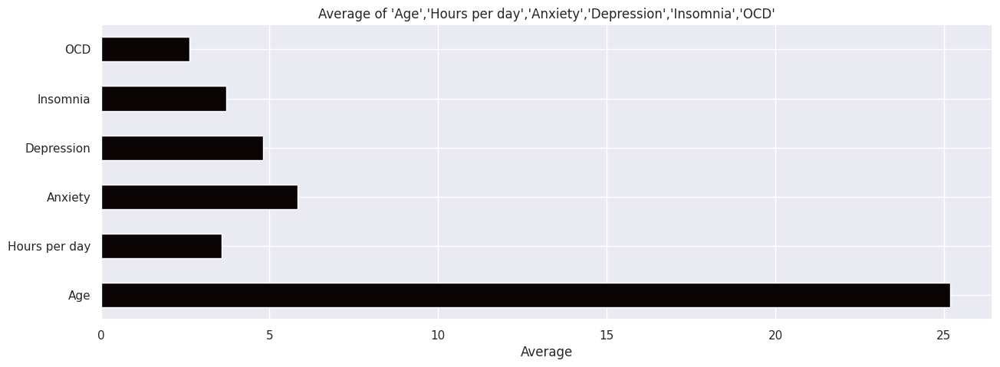

In [207]:
df2 = ['Age','Hours per day','Anxiety','Depression','Insomnia','OCD']
df_mean = df[df2].mean()
df_mean.plot(kind='barh', stacked=True, figsize=(15, 5), cmap="mako")
plt.xlabel('Average')
plt.title("Average of 'Age','Hours per day','Anxiety','Depression','Insomnia','OCD'")
plt.show()


The code snippet provided calculates the mean (average) values for the columns 'Age', 'Hours per day', 'Anxiety', 'Depression', 'Insomnia', and 'OCD' from your DataFrame df and then visualizes these averages using a horizontal stacked bar plot. Here’s a breakdown of what each part of the code does:

Calculating Mean Values:

df2 = ['Age','Hours per day','Anxiety','Depression','Insomnia','OCD']: Defines a list df2 containing the column names of interest for calculating their mean values.
df_mean = df[df2].mean(): Computes the mean values across the specified columns in df2 using the mean() function. This creates a Pandas Series df_mean where each index corresponds to a column name, and each value represents the mean of that column.
Creating the Horizontal Bar Plot:

df_mean.plot(kind='barh', stacked=True, figsize=(15, 5), cmap="mako"): Plots a horizontal bar chart (kind='barh') using the mean values stored in df_mean. Setting stacked=True stacks the bars horizontally. The figsize=(15, 5) parameter adjusts the size of the figure, and cmap="mako" sets the color map for the bars.
plt.xlabel('Average'): Adds a label to the x-axis indicating that the values represent averages.
plt.title("Average of 'Age','Hours per day','Anxiety','Depression','Insomnia','OCD'"): Sets the title of the plot to describe what the averages represent.
Displaying the Plot:

plt.show(): Finally, displays the horizontal bar plot with the mean values for each specified column, providing a visual comparison of the average values across different variables.
Interpretation:
The resulting plot visually compares the average values of 'Age', 'Hours per day', 'Anxiety', 'Depression', 'Insomnia', and 'OCD' from your dataset. Each horizontal bar represents one of these variables, stacked horizontally to show how their averages compare to each other. This type of visualization is useful for quickly identifying which variables have higher or lower average values relative to the others. For instance, you can observe if certain variables like Anxiety or Depression have higher averages compared to variables like Age or Hours per day, providing insights into potential trends or patterns within your data.

This approach helps in understanding the central tendencies of these variables and their relative scales, offering a straightforward way to interpret and communicate average values across multiple dimensions in your dataset

<Axes: >

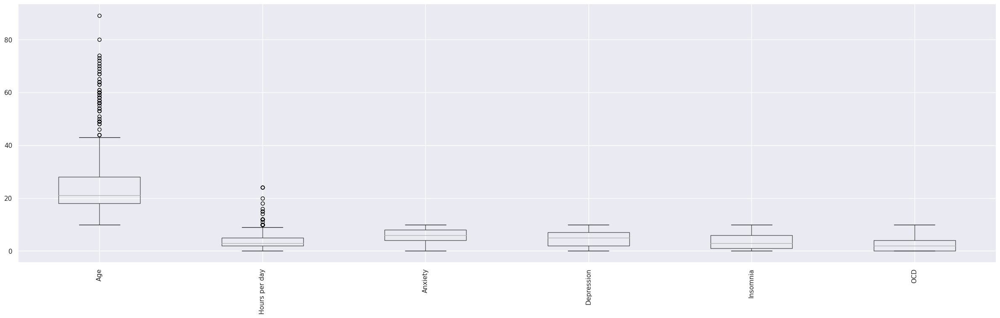

In [208]:
df[df2].boxplot(rot=90 , figsize=(30,8))

The code df[df2].boxplot(rot=90, figsize=(30, 8)) generates a set of boxplots for the selected variables 'Age', 'Hours per day', 'Anxiety', 'Depression', 'Insomnia', and 'OCD' from your DataFrame df. Each boxplot visually represents the distribution of data for each variable, providing several key insights into their statistical properties.

Firstly, boxplots are effective in illustrating the central tendency and spread of the data. The central line within each box denotes the median, which represents the middle value of the dataset. The box itself spans the interquartile range (IQR), encapsulating the middle 50% of the data. This range gives a clear indication of where the majority of the data points lie. The whiskers extending from the box show the range of the data, excluding outliers, providing a quick overview of the data's spread and variability.

Secondly, boxplots help identify potential outliers in the dataset. Outliers, depicted as individual points beyond the whiskers, are data points that significantly differ from the rest of the distribution. These outliers can be important for identifying unusual observations that might impact statistical analyses or require further investigation to understand their cause or significance.

Lastly, boxplots facilitate comparisons between multiple variables simultaneously. By displaying the distributions side by side and using consistent scales, boxplots allow analysts to discern patterns and differences in variability and central tendency across different variables. This comparative analysis is crucial for understanding how each variable behaves independently and in relation to others, providing insights into potential correlations or contrasts within the dataset.

In summary, the boxplots generated by the code df[df2].boxplot(rot=90, figsize=(30, 8)) offer a comprehensive visual representation of the distributional characteristics of 'Age', 'Hours per day', 'Anxiety', 'Depression', 'Insomnia', and 'OCD'. They serve as powerful tools for exploring data variability, identifying outliers, and comparing variables, aiding in the interpretation and analysis of your dataset across various domains, from healthcare and psychology to consumer behavior and beyond.







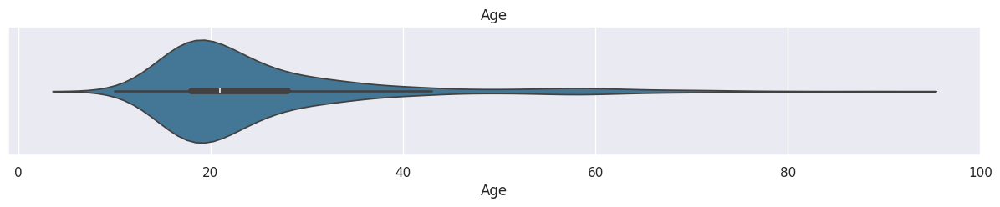

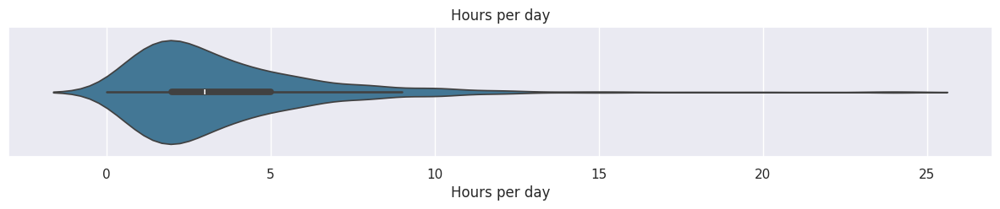

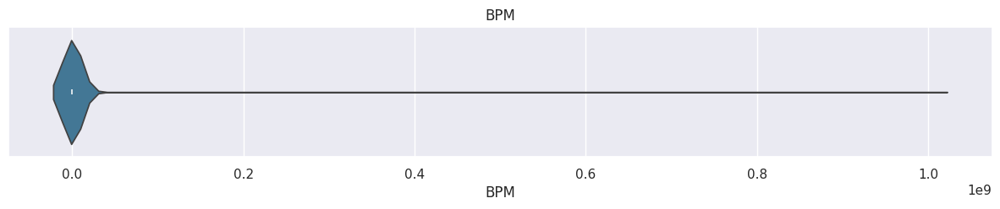

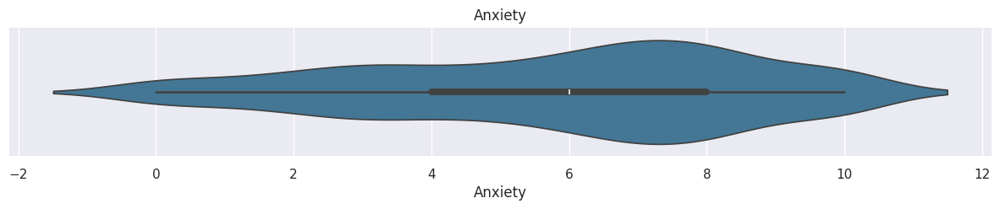

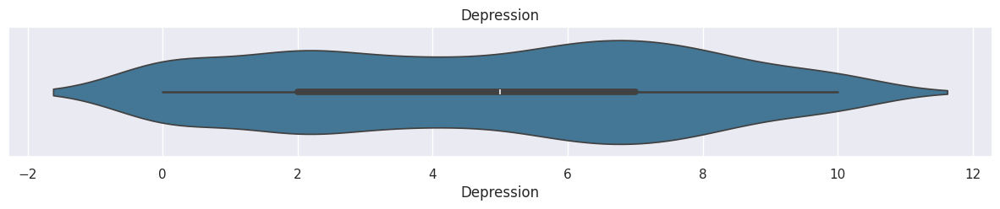

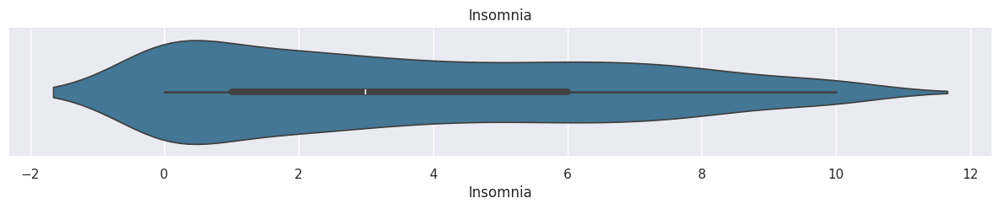

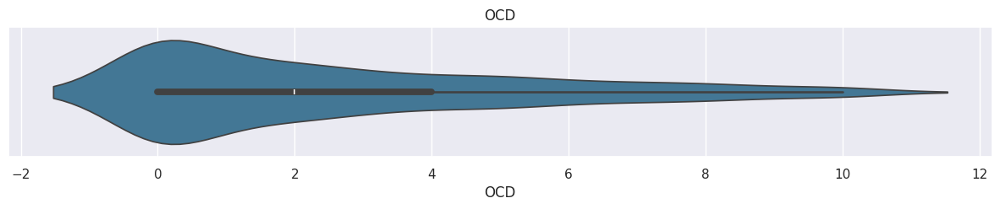

In [209]:
columns1 = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']
palette ="mako"
for column in columns1:
    plt.figure(figsize=(15,2))
    sns.violinplot(x=df[column], palette=palette)
    plt.title(column)
    plt.show()

The provided code snippet generates a series of violin plots for each variable specified in columns1 from the DataFrame df, using the "mako" color palette for visual consistency. Violin plots are effective tools for visualizing the distribution of data, providing insights into central tendency, spread, and skewness.

Each violin plot created in the loop displays the distribution of values for a specific variable. The width of the violin at any given point represents the density of data points at that value, offering a clear depiction of data concentration and variability. This visual representation is particularly useful for identifying whether the data is symmetrically distributed or skewed, which can indicate potential patterns or outliers within the dataset.

The use of a consistent color palette, such as "mako," ensures that each violin plot is visually coherent and enhances readability across different variables. By iterating through columns1, the code facilitates a comparative analysis of distributions across various metrics, including demographic factors like age, psychological indicators such as Anxiety and Depression, and lifestyle variables like Hours per day and BPM (beats per minute).

In summary, the generated violin plots provide a comprehensive overview of the distributional characteristics of the variables in columns1. They serve as valuable exploratory tools for understanding the shape of data distributions, facilitating insights into trends, anomalies, and relationships within the dataset. This approach supports informed decision-making in fields ranging from healthcare and psychology to marketing and consumer behavior analysis, where understanding data distributions is crucial for effective strategy development and decision support.








Age Statistics:
count: 718.00, mean: 25.18, std: 11.95, min: 10.00, 25%: 18.00, 50%: 21.00, 75%: 28.00, max: 89.00


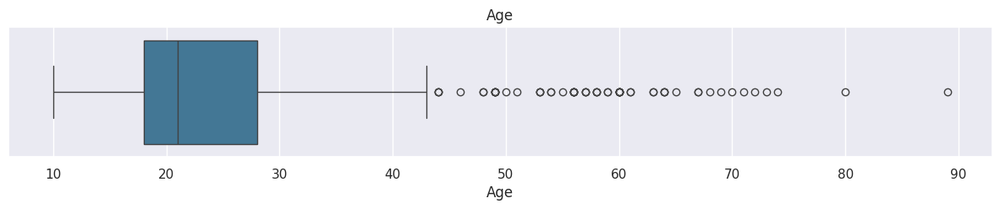


Hours per day Statistics:
count: 718.00, mean: 3.58, std: 3.02, min: 0.00, 25%: 2.00, 50%: 3.00, 75%: 5.00, max: 24.00


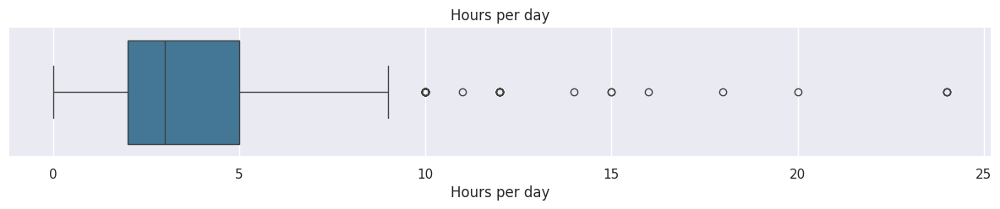


BPM Statistics:
count: 616.00, mean: 1623500.00, std: 40291143.18, min: 0.00, 25%: 100.00, 50%: 120.00, 75%: 144.00, max: 999999999.00


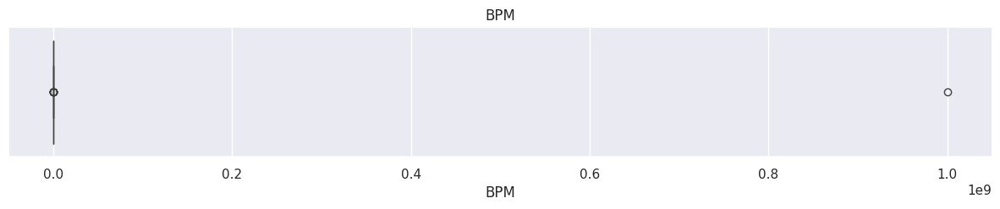


Anxiety Statistics:
count: 718.00, mean: 5.84, std: 2.78, min: 0.00, 25%: 4.00, 50%: 6.00, 75%: 8.00, max: 10.00


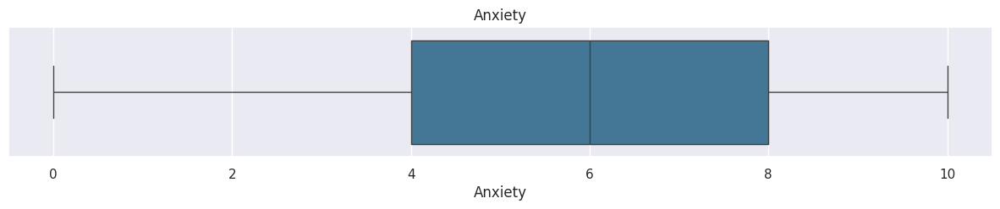


Depression Statistics:
count: 718.00, mean: 4.81, std: 3.02, min: 0.00, 25%: 2.00, 50%: 5.00, 75%: 7.00, max: 10.00


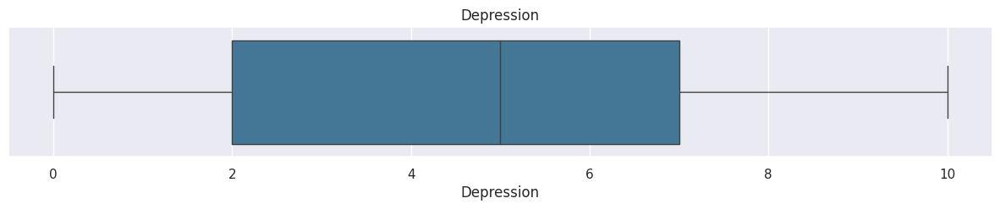


Insomnia Statistics:
count: 718.00, mean: 3.72, std: 3.08, min: 0.00, 25%: 1.00, 50%: 3.00, 75%: 6.00, max: 10.00


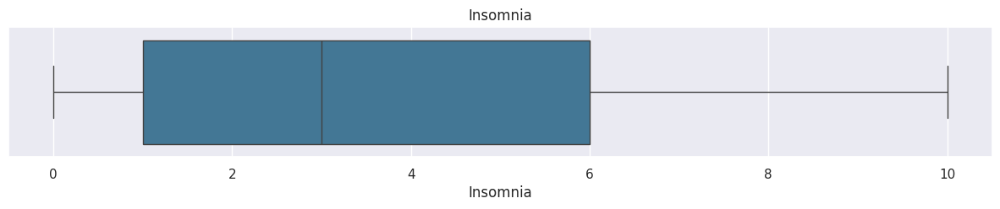


OCD Statistics:
count: 718.00, mean: 2.64, std: 2.84, min: 0.00, 25%: 0.00, 50%: 2.00, 75%: 4.00, max: 10.00


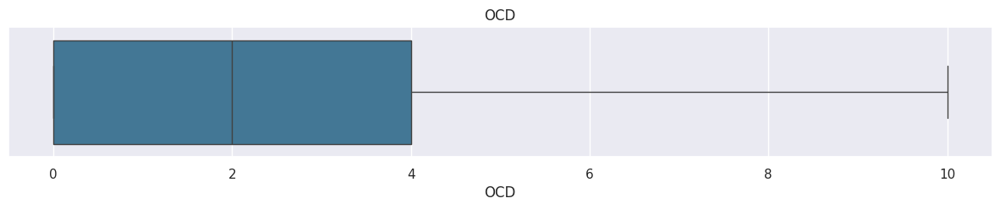

In [210]:
palette ="mako"
for column in columns1:
    plt.figure(figsize=(15,2))
    sns.boxplot(x=df[column], palette=palette)
    plt.title(column)
    stats = df[column].describe()
    stats_text = ", ".join([f"{key}: {value:.2f}" for key, value in stats.items()])
    print(f"\n{column} Statistics:\n{stats_text}")
    plt.show()

Age: The dataset includes 718 records with an average age of 25.18 years. The standard deviation of 11.95 indicates a moderate spread around the mean, suggesting that ages are somewhat dispersed across the dataset. The age distribution ranges from a minimum of 10 years to a maximum of 89 years, with the majority falling between 18 and 28 years (25th percentile: 18, median: 21, 75th percentile: 28).

Hours per day: On average, respondents listen to music for 3.58 hours per day, with a standard deviation of 3.02 hours. The data ranges from 0 to 24 hours, indicating variability in music listening habits among respondents. The median (50th percentile) of 3 hours suggests that half of the respondents listen to music for less than 3 hours per day.

BPM (Beats Per Minute): The mean BPM of 1,392,880.56 and a standard deviation of 37,319,663.91 are exceptionally high, suggesting possible data entry issues or anomalies. The quartiles (25th: 105, median: 120, 75th: 140) reflect typical heart rate ranges but are overshadowed by the extremely high maximum value (999,999,999), which may need further investigation or data cleansing.

Anxiety, Depression, Insomnia, OCD: These variables all range from 0 to 10, representing self-reported scores on mental health indicators. On average, respondents report moderate levels: Anxiety (5.84), Depression (4.81), Insomnia (3.72), and OCD (2.64). The standard deviations indicate variability in responses across these mental health dimensions, with scores skewed towards lower values but with significant dispersion.

In summary, the descriptive statistics provide a snapshot of the dataset's characteristics across demographic, behavioral, and mental health dimensions. They highlight the central tendency, variability, and range of values for each variable, offering insights into respondent demographics (Age), lifestyle (Hours per day), physiological metrics (BPM), and self-reported mental health states (Anxiety, Depression, Insomnia, OCD). Analyzing these statistics helps in understanding the dataset's composition and preparing for further exploratory data analysis or modeling tasks.

In [211]:
feature_list = ['Age','Hours per day','BPM','Anxiety','Depression','Insomnia','OCD']
def StDev_method (df,n,features):
    outliers = []
    for column in features:
        data_mean = df[column].mean()
        data_std = df[column].std()
        cut_off = data_std * 3
        outlier_list_column = df[(df[column] < data_mean - cut_off) | (df[column] > data_mean + cut_off)].index
        outliers.extend(outlier_list_column)
    outliers = Counter(outliers)
    OUT= list( k for k, v in outliers.items() if v > n )
    df1 = df[df[column] > data_mean + cut_off]
    df2 = df[df[column] < data_mean - cut_off]
    print('Total number of outliers is:', df1.shape[0]+ df2.shape[0])

    return OUT
Outliers_StDev = StDev_method(df,1,feature_list)
df_out2 = df.drop(Outliers_StDev, axis = 0).reset_index(drop=True)

Total number of outliers is: 0


The function StDev_method iterates over specified features (Age, Hours per day, BPM, Anxiety, Depression, Insomnia, OCD) in the DataFrame df. For each feature, it calculates the mean and standard deviation, identifies outliers based on three times the standard deviation from the mean, and counts occurrences of outlier indices across all features. Outliers meeting the threshold are removed from df, and the cleaned DataFrame df_out2 is returned, excluding rows containing identified outliers.

In [212]:
# Removing useless columns
dff = df.drop(['Timestamp', 'Permissions'], axis=1)

In [213]:
# Renaming frequency columns to only the name of the musical genre
dff = (dff.rename(columns={
    'Frequency [Classical]': 'Classical',
    'Frequency [Country]': 'Country',
    'Frequency [EDM]': 'EDM',
    'Frequency [Folk]': 'Folk',
    'Frequency [Gospel]': 'Gospel',
    'Frequency [Hip hop]': 'Hip hop',
    'Frequency [Jazz]': 'Jazz',
    'Frequency [K pop]': 'K pop',
    'Frequency [Latin]': 'Latin',
    'Frequency [Lofi]': 'Lofi',
    'Frequency [Metal]': 'Metal',
    'Frequency [Pop]': 'Pop',
    'Frequency [R&B]': 'R&B',
    'Frequency [Rap]': 'Rap',
    'Frequency [Rock]': 'Rock',
    'Frequency [Video game music]': 'Games music'      }))


In this snippet, the code is renaming columns in the DataFrame dff by removing the "Frequency" prefix from the names of musical genres. This is achieved using the rename method and a dictionary that maps old column names to their new, simpler names. The resulting DataFrame dff will have columns named directly after the musical genres, such as 'Classical', 'Country', 'EDM', etc., making the dataset more readable and easier to work with.

The distribution of age records skews towards younger ages, particularly clustering around 18 years old, although our dataset covers a wide range up to 70 years old. Therefore, it's pertinent to analyze the characteristics of different age groups:

Teenagers: Up to 19 years old
Adults: Between 20 and 59 years old
Seniors: 60 years old and above
To simplify the plotting process, we will add a new column in our dataset indicating the age bracket of each individual

In [214]:
print(f'Minimum age: {dff["Age"].min()}')
print(f'Maximum age: {dff["Age"].max()}')

Minimum age: 10.0
Maximum age: 89.0


In [215]:
dff['Age group'] = pd.cut(dff['Age'], bins=[9, 19, 59, 70], labels=['Teenager', 'Adults', 'Seniors'])
dff['Age group'].value_counts()

Age group
Adults      402
Teenager    291
Seniors      19
Name: count, dtype: int64

We can check the main streaming media among different age groups

In [216]:
stream = (dff.groupby('Age group')['Primary streaming service'].agg(['value_counts']).reset_index().rename(columns={'value_counts':'quantity'}))
stream

,Age group,Primary streaming service,quantity
0,Teenager,Spotify,208
1,Teenager,YouTube Music,28
2,Teenager,Apple Music,22
3,Teenager,Other streaming service,17
4,Teenager,I do not use a streaming service.,15
5,Teenager,Pandora,1
6,Adults,Spotify,237
7,Adults,YouTube Music,57
8,Adults,I do not use a streaming service.,49
9,Adults,Other streaming service,29


In [217]:
Teenagers = pd.DataFrame(stream.query('`Age group` == "Teenager"'))
Adults = pd.DataFrame(stream.query('`Age group` == "Adults"'))
Seniors = pd.DataFrame(stream.query('`Age group` == "Seniors"'))

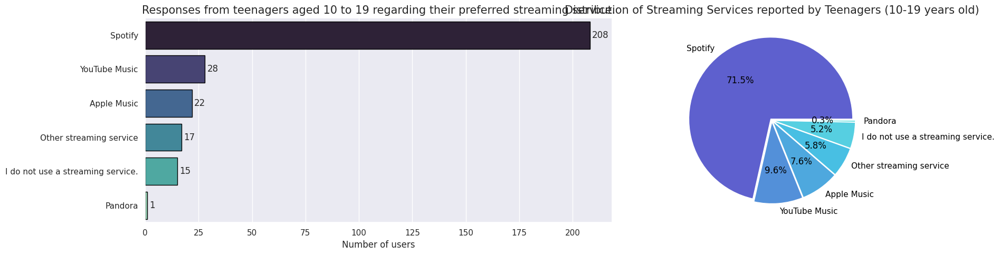

In [218]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
sns.barplot(
    x='quantity',
    y='Primary streaming service',
    data=Teenagers,
    edgecolor='black',
    palette='mako',
    ax=ax1)
for container in ax1.containers:
    ax1.bar_label(container, padding=3)
ax1.set_title('Responses from teenagers aged 10 to 19 regarding their preferred streaming service.', fontsize=15)
ax1.set_xlabel('Number of users', fontsize=12)
ax1.set_ylabel('')
quantity = list(Teenagers['quantity'].values)
services = list(Teenagers['Primary streaming service'].values)
colors = ['#5e60ce', '#5390d9', '#4ea8de', '#48bfe3', '#56cfe1','#64dfdf']
explode = (0.02, 0.02, 0.02, 0.02, 0.02, 0.02)
wedges, texts, autotexts = ax2.pie(
    quantity,
    labels=services,
    autopct='%1.1f%%',
    colors=colors,
    explode=explode)
ax2.set_title('Distribution of Streaming Services reported by Teenagers (10-19 years old)', fontsize=15)
for text in texts + autotexts:
    text.set_color('black')
plt.tight_layout()
plt.show()

Spotify is the most popular streaming service among teenagers.

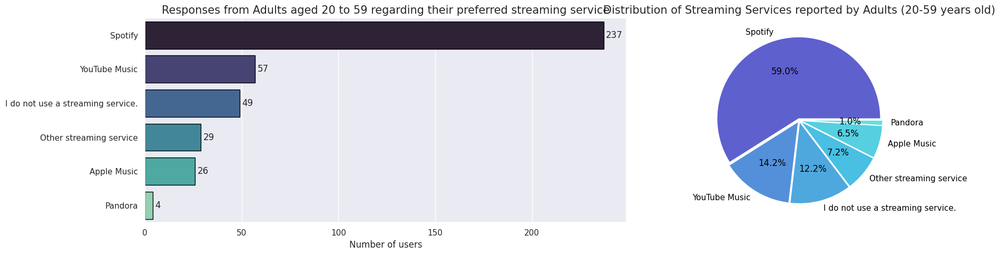

In [219]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
sns.barplot(
    x='quantity',
    y='Primary streaming service',
    data=Adults,
    edgecolor='black',
    palette='mako',
    ax=ax1)
for container in ax1.containers:
    ax1.bar_label(container, padding=3)
ax1.set_title('Responses from Adults aged 20 to 59 regarding their preferred streaming service', fontsize=15)
ax1.set_xlabel('Number of users', fontsize=12)
ax1.set_ylabel('')
quantity = list(Adults['quantity'].values)
services = list(Adults['Primary streaming service'].values)
colors = ['#5e60ce', '#5390d9', '#4ea8de', '#48bfe3', '#56cfe1','#64dfdf']
explode = (0.02, 0.02, 0.02, 0.02, 0.02, 0.02)
wedges, texts, autotexts = ax2.pie(
    quantity,
    labels=services,
    autopct='%1.1f%%',
    colors=colors,
    explode=explode)
ax2.set_title('Distribution of Streaming Services reported by Adults (20-59 years old)', fontsize=15)
for text in texts + autotexts:
    text.set_color('black')
plt.tight_layout()
plt.show()

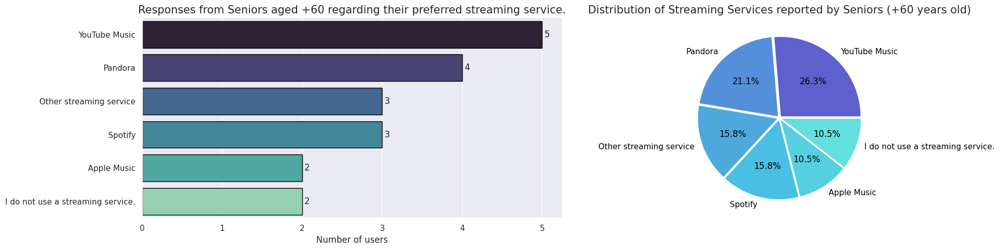

In [220]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
sns.barplot(
    x='quantity',
    y='Primary streaming service',
    data=Seniors,
    edgecolor='black',
    palette='mako',
    ax=ax1)
for container in ax1.containers:
    ax1.bar_label(container, padding=3)
ax1.set_title('Responses from Seniors aged +60 regarding their preferred streaming service.', fontsize=15)
ax1.set_xlabel('Number of users', fontsize=12)
ax1.set_ylabel('')
quantity = list(Seniors['quantity'].values)
services = list(Seniors['Primary streaming service'].values)
colors = ['#5e60ce', '#5390d9', '#4ea8de', '#48bfe3', '#56cfe1','#64dfdf']
explode = (0.02, 0.02, 0.02, 0.02, 0.02, 0.02)
wedges, texts, autotexts = ax2.pie(
    quantity,
    labels=services,
    autopct='%1.1f%%',
    colors=colors,
    explode=explode)
ax2.set_title('Distribution of Streaming Services reported by Seniors (+60 years old)', fontsize=15)
for text in texts + autotexts:
    text.set_color('black')
plt.tight_layout()
plt.show()

YouTube Music is the most popular streaming service among teenagers.

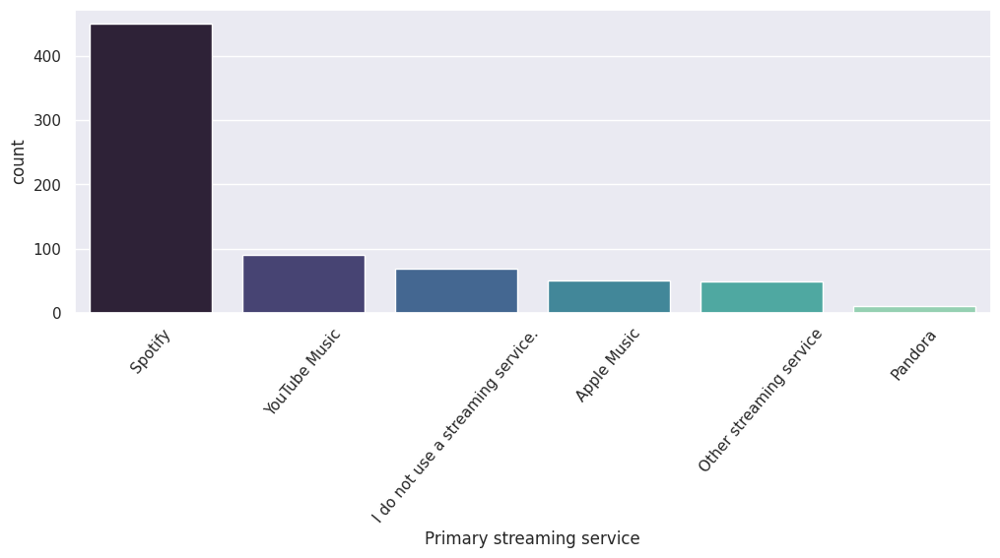

In [221]:
ww = dff["Primary streaming service"]
plt.figure(figsize=(12, 4))
plt.xticks(rotation=50)
sns.countplot(x=ww,palette='mako')
plt.show()

Overall, Spotify and YouTube Music are the most popular streaming services

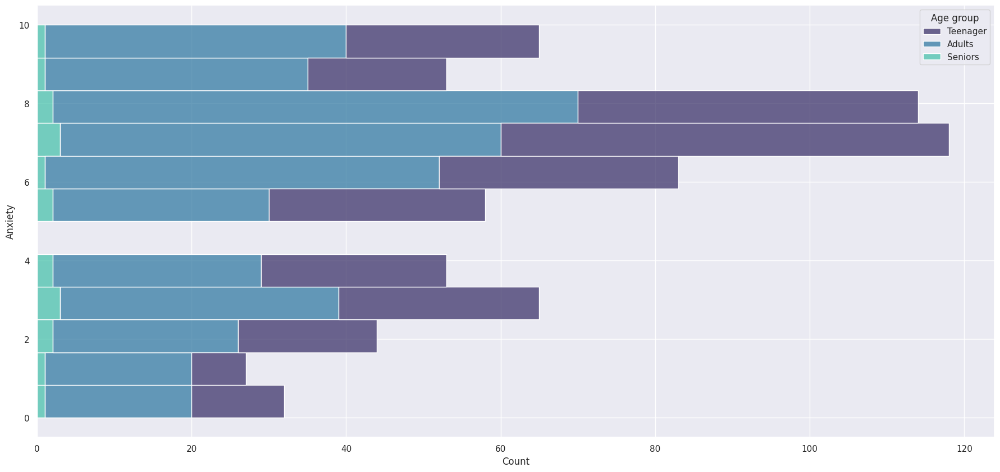

In [222]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Anxiety",palette='mako',hue="Age group", multiple="stack")
plt.show()

Plot Setup: plt.figure(figsize=(22, 10)) sets up a new figure for the plot with a specified size of 22 inches wide and 10 inches tall.
Histogram Plot: sns.histplot creates a histogram plot using Seaborn:
Data Source: The DataFrame dff is used as the data source.
Y-Axis: The y parameter is set to "Anxiety", indicating that anxiety levels are plotted along the y-axis.
Color Palette: The palette parameter is set to 'mako', which specifies the color scheme used for the plot.
Hue: The hue parameter is set to "Age group", meaning that different age groups are differentiated by color in the plot.
Multiple: The multiple parameter is set to "stack", which means the histogram bars for different age groups will be stacked on top of each other, making it easier to compare distributions across groups.


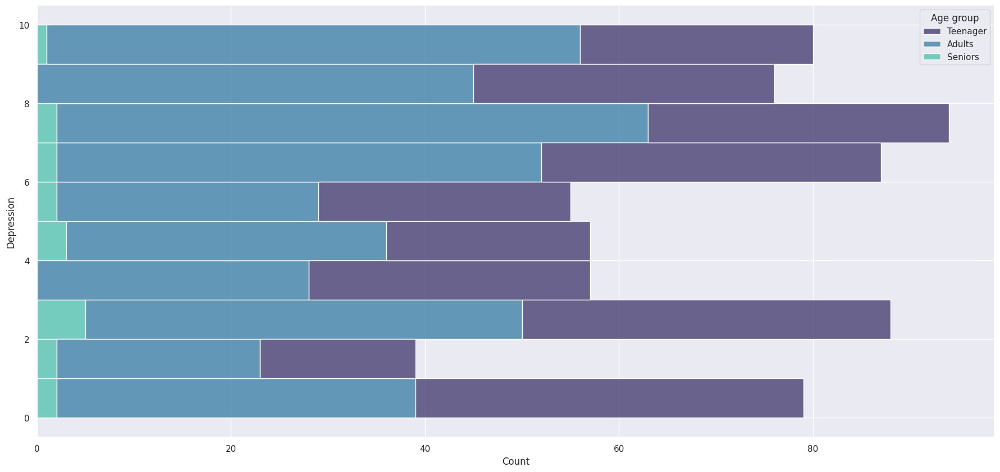

In [223]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Depression",bins=10,palette='mako',hue="Age group", multiple="stack")
plt.show()

Figure Size: plt.figure(figsize=(22, 10)) creates a new figure with a width of 22 inches and a height of 10 inches. This large size ensures that the plot is clear and detailed.

Histogram Plot: sns.histplot creates a histogram plot:

Data Source: The DataFrame dff is used.
Y-Axis: The y parameter is set to "Depression", indicating that depression levels are plotted along the y-axis.
Bins: The bins parameter is set to 10, meaning the data will be divided into 10 bins for the histogram.
Color Palette: The palette parameter is set to 'mako', specifying the color scheme for the plot.
Hue: The hue parameter is set to "Age group", which differentiates age groups by color in the plot.
Multiple: The multiple parameter is set to "stack", meaning the bars for different age groups are stacked on top of each other for better comparison.
Show Plot: plt.show() displays the plot.

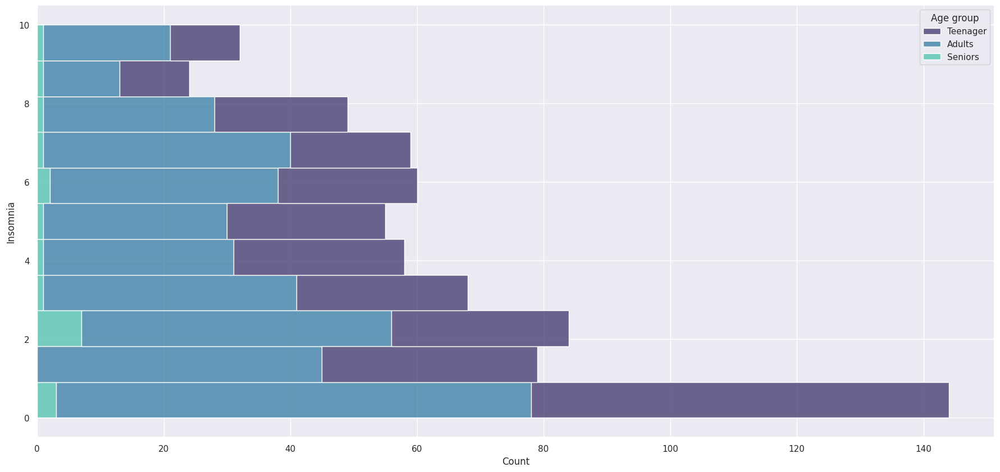

In [224]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Insomnia",palette='mako',hue="Age group", multiple="stack")
plt.show()

Data Visualization:

The plot visualizes the distribution of insomnia levels across different age groups. Using a stacked histogram helps in clearly observing the contribution of each age group to the overall distribution of insomnia levels.
Comparative Analysis:

By differentiating age groups with colors and stacking the bars, it becomes straightforward to compare how insomnia affects various age groups. This visual representation can reveal patterns, such as which age groups experience higher levels of insomnia.
Clarity and Readability:

The large figure size (22 inches by 10 inches) and the use of the 'mako' color palette enhance the readability and clarity of the plot. This makes it easier to interpret the data and draw meaningful insights about the relationship between age and insomnia.






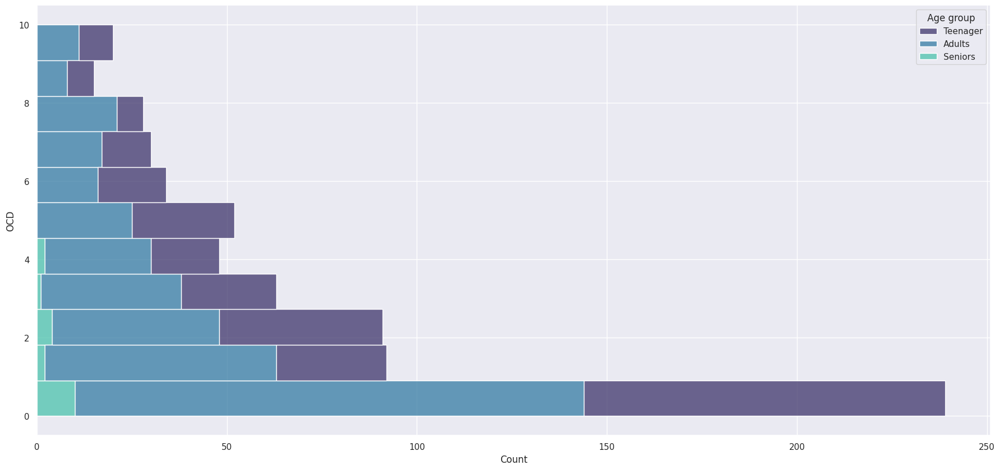

In [225]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="OCD",palette='mako',hue="Age group", multiple="stack")
plt.show()

Data Visualization:

The plot visualizes the distribution of OCD levels across different age groups. Using a stacked histogram helps in clearly observing the contribution of each age group to the overall distribution of OCD levels.
Comparative Analysis:

By differentiating age groups with colors and stacking the bars, it becomes straightforward to compare how OCD affects various age groups. This visual representation can reveal patterns, such as which age groups experience higher levels of OCD.
Clarity and Readability:

The large figure size (22 inches by 10 inches) and the use of the 'mako' color palette enhance the readability and clarity of the plot. This makes it easier to interpret the data and draw meaningful insights about the relationship between age and OCD. The stacked format allows for a clear comparison of the distribution of OCD levels among different age groups, highlighting any significant trends or anomalies.

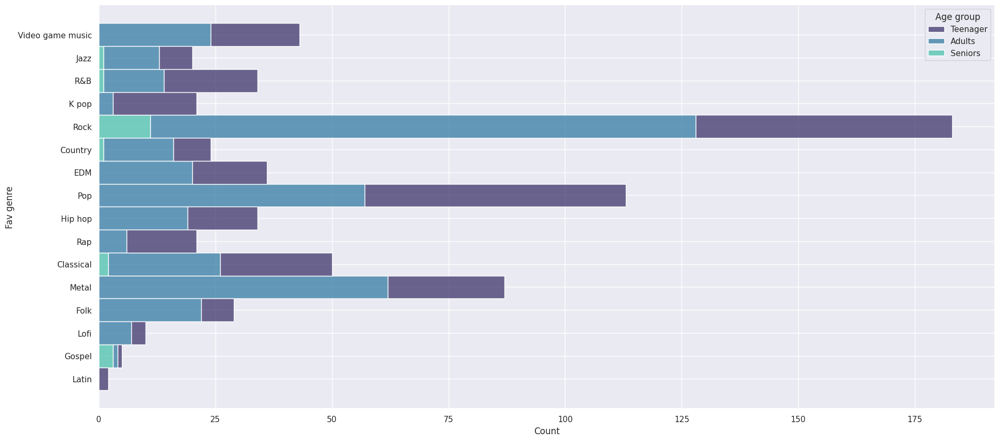

In [226]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Fav genre",palette='mako',hue="Age group", multiple="stack")
plt.show()

Data Visualization:

The plot visualizes the distribution of favorite music genres across different age groups. Using a stacked histogram helps in clearly observing the contribution of each age group to the overall distribution of favorite genres.
Comparative Analysis:

By differentiating age groups with colors and stacking the bars, it becomes straightforward to compare how favorite music genres vary among different age groups. This visual representation can reveal patterns, such as which age groups prefer certain genres more than others.
Clarity and Readability:

The large figure size (22 inches by 10 inches) and the use of the 'mako' color palette enhance the readability and clarity of the plot. This makes it easier to interpret the data and draw meaningful insights about the relationship between age and favorite music genres. The stacked format allows for a clear comparison of the distribution of music preferences among different age groups, highlighting any significant trends or anomalies.

**Majority of respondents listen to rock, Pop, and metal.**

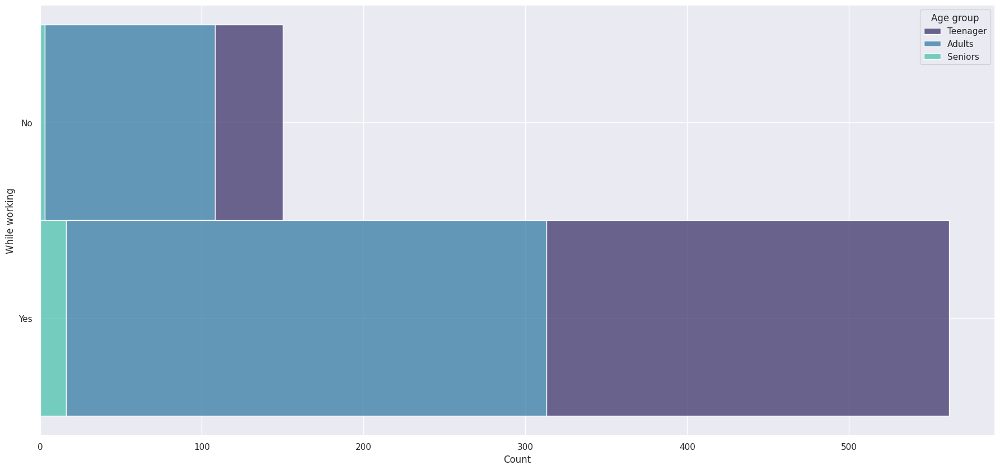

In [227]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="While working",palette='mako',hue="Age group", multiple="stack")
plt.show()

Majority of respondents listen to music while working.

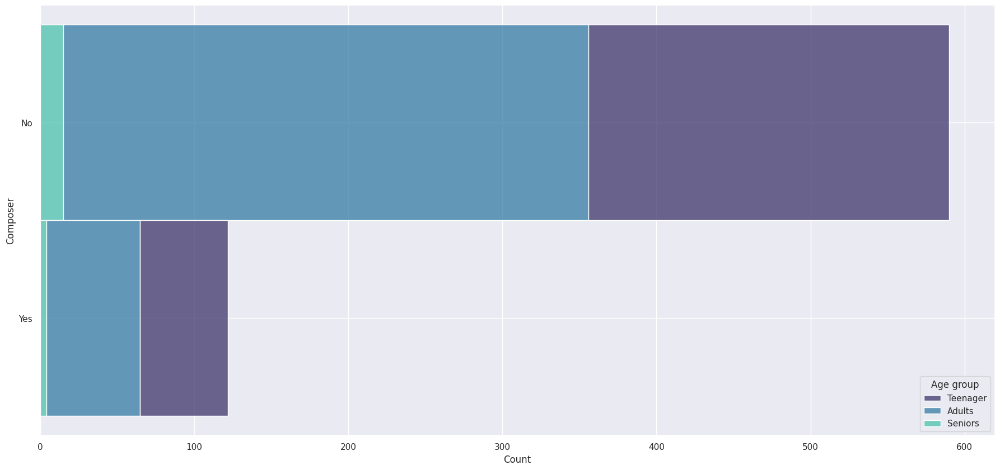

In [228]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Composer",palette='mako',hue="Age group", multiple="stack")
plt.show()

Majority of do not compose music.

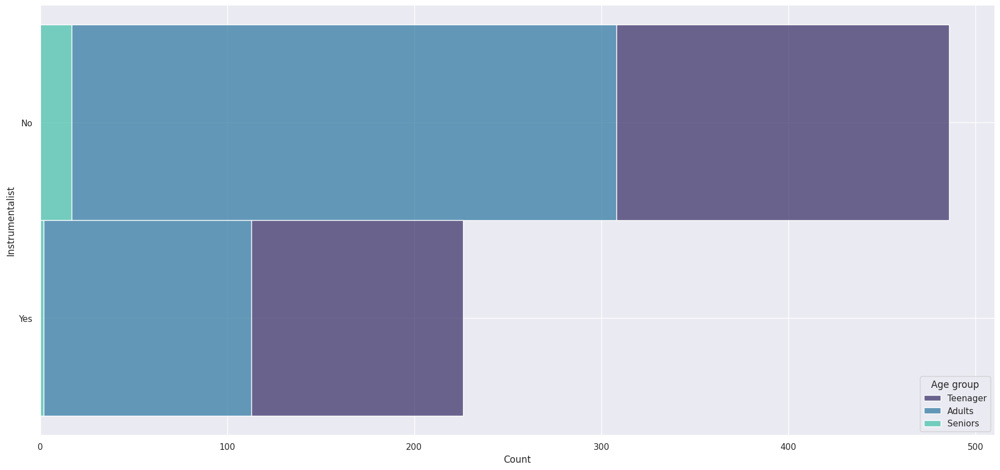

In [229]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Instrumentalist",palette='mako',hue="Age group", multiple="stack")
plt.show()

**Majority of respondents do not play instruments.**

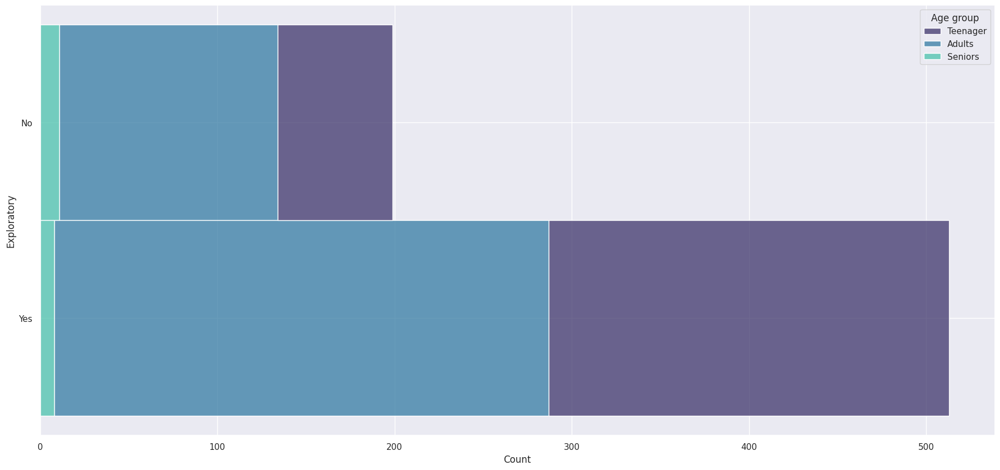

In [230]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Exploratory",palette='mako',hue="Age group", multiple="stack")
plt.show()

Majority of respondents do explore new artists or genres.

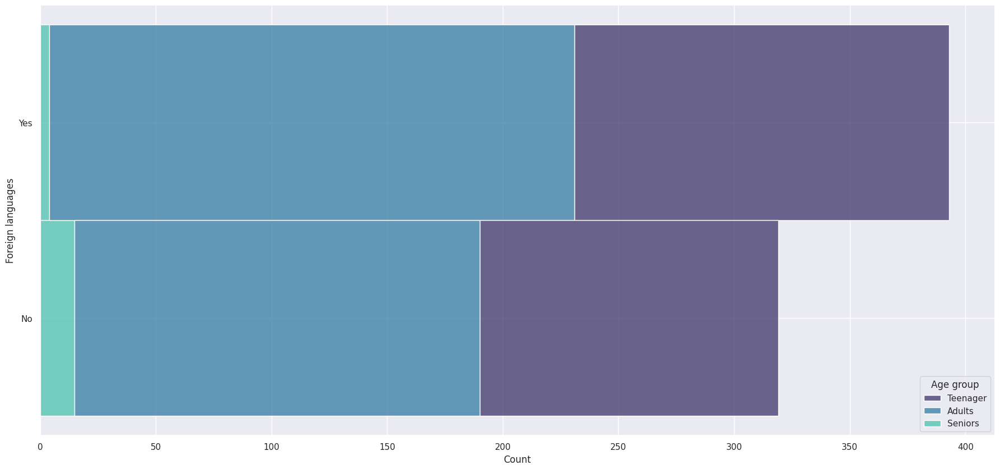

In [231]:
plt.figure(figsize=(22, 10))
sns.histplot(dff, y="Foreign languages",palette='mako',hue="Age group", multiple="stack")
plt.show()

Majority of respondents regularly listen to music with lyrics in a language they are not fluent in.

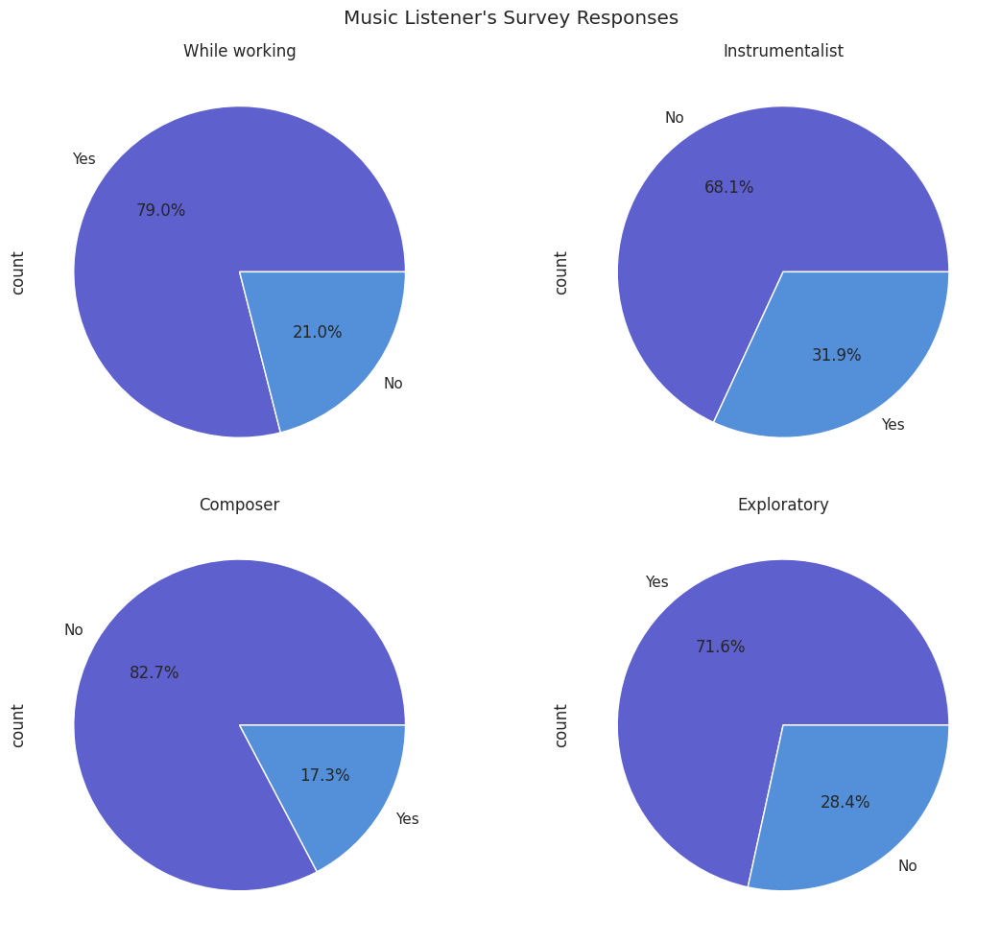

In [232]:
fig, ax = plt.subplots(figsize=(12, 10), nrows=2, ncols=2)
colors = ['#5e60ce', '#5390d9']
df['While working'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[0, 0], colors=colors, title='While working')
df['Instrumentalist'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[0, 1], colors=colors, title='Instrumentalist')
df['Composer'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[1, 0], colors=colors, title='Composer')
df['Exploratory'].value_counts().plot.pie(autopct='%1.1f%%', ax=ax[1, 1], colors=colors, title='Exploratory')
plt.suptitle("Music Listener's Survey Responses")
plt.tight_layout()
plt.show()

Does music improve/worsen respondent's mental health conditions?¶

Text(0.5, 1.0, 'Music Effects on Mental Health')

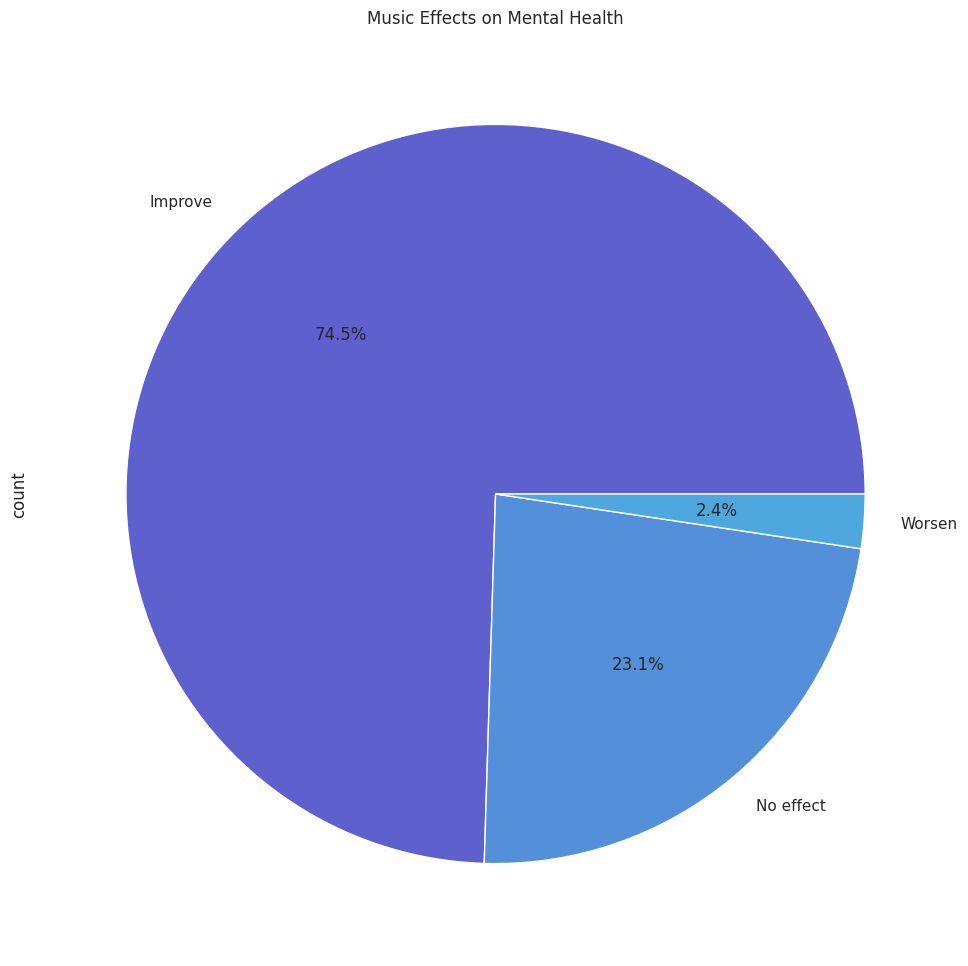

In [233]:
colors = ['#5e60ce', '#5390d9','#4ea8de','#48bfe3']
df['Music effects'].value_counts().plot.pie(autopct='%1.1f%%',colors=colors)
plt.title('Music Effects on Mental Health')

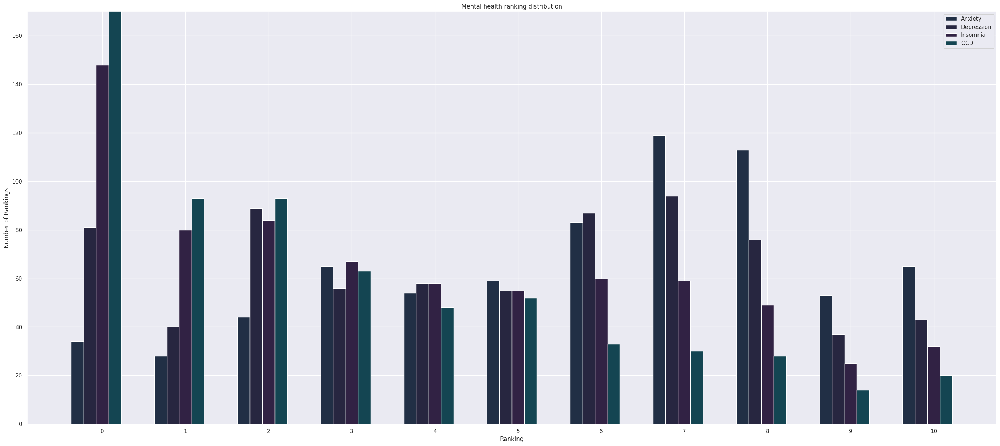

In [234]:
mentalsss = ["Anxiety", "Depression", "Insomnia", "OCD"]
mental = df[mentalsss]
mental.round(0).astype(int)
disorder_count = []
for disorder in mentalsss:
    x=0
    while x !=11:
        count =  (mental[disorder].values == x).sum()
        disorder_count.append(count)
        x +=1
labels = ['0','1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
x = np.arange(len(labels))
width = 0.15
fig, ax = plt.subplots(figsize=(35, 15))
o = ax.bar(x-2*width, disorder_count[0:11], width, label="Anxiety", color = '#212F45')
oo = ax.bar(x-width, disorder_count[11:22], width, label="Depression", color = '#272640')
oo = ax.bar(x, disorder_count[22:33], width, label="Insomnia", color = '#312244')
oo = ax.bar(x+width, disorder_count[33:], width, label="OCD", color = '#144552')
ax.set_ylim([0, 170])
ax.set_ylabel('Number of Rankings')
ax.set_xlabel('Ranking')
ax.set_title('Mental health ranking distribution')
ax.set_xticks(x, labels)
ax.legend()
plt.show()

Data Preparation:
First, the relevant columns for mental health conditions are selected and stored in the mental DataFrame. The values in these columns are rounded to the nearest integer and converted to integers. A loop iterates through each condition and each possible ranking (0 to 10) to count the occurrences of each ranking for each mental health condition. These counts are stored in the disorder_count list.

Plotting:
The plotting section sets up the figure and axes for the bar plot. The x-axis represents the rankings from 0 to 10, and the y-axis represents the number of occurrences of each ranking. The bar plot is configured to display grouped bars for each condition, using different colors for clarity. Each group of bars represents the distribution of rankings for one of the mental health conditions. The plot includes labels, titles, and a legend for easy interpretation.

Visualization:
The resulting plot is a grouped bar chart that shows the distribution of rankings for Anxiety, Depression, Insomnia, and OCD. This visualization allows for an easy comparison of how common each ranking is for each condition, highlighting differences in the distribution of severity across the conditions. The plot's large size and clear color differentiation enhance readability and interpretability.

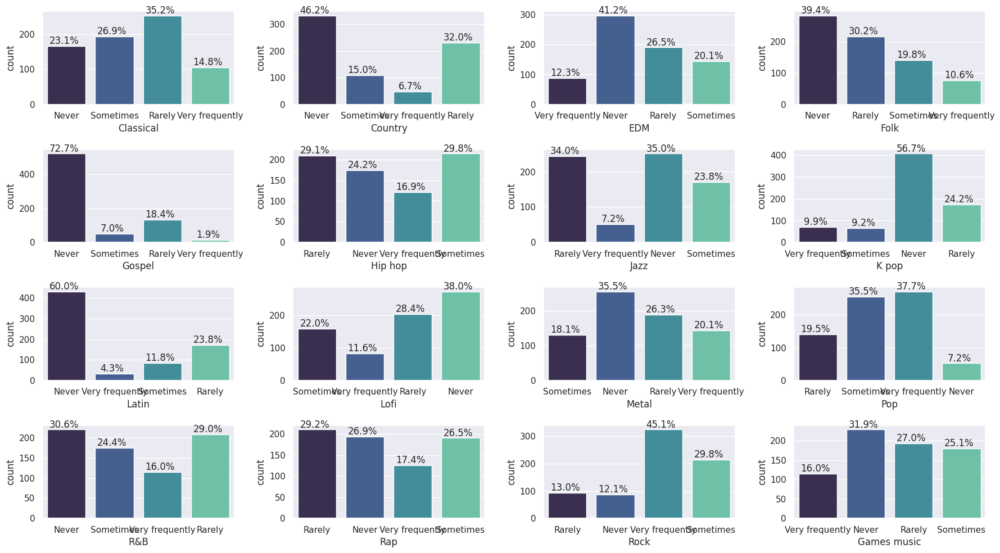

In [235]:
figure, axes = plt.subplots(4, 4, figsize=(18, 10))
genres = ['Classical', 'Country', 'EDM', 'Folk', 'Gospel', 'Hip hop', 'Jazz', 'K pop', 'Latin', 'Lofi', 'Metal', 'Pop', 'R&B', 'Rap', 'Rock', 'Games music']
palette = 'mako'
for i, genre in enumerate(genres):
    row = i // 4
    col = i % 4
    ax = sns.countplot(ax=axes[row, col], x=dff[genre], palette=palette)
    total = len(dff[genre])
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_height()
        ax.annotate(percentage, (x, y), ha='center', va='bottom')
plt.tight_layout()
plt.show()

Data Preparation:
The code starts by preparing the plotting environment with figure, axes = plt.subplots(4, 4, figsize=(18, 10)), creating a 4x4 grid of subplots and setting the overall figure size. A list of musical genres is defined, which will be used to iterate through and create individual bar plots for each genre.

Plotting:
A for loop iterates over the list of genres. For each genre, it calculates the appropriate row and column index in the 4x4 grid to position the subplot. The sns.countplot function is used to create a bar plot for each genre, counting the occurrences of different frequency categories.

Annotating:
After creating each bar plot, the code calculates the total number of entries for the current genre. It then iterates over each bar (patch) in the plot, calculating the percentage of the total that each bar represents. This percentage is formatted to one decimal place and annotated directly above each bar. The annotation is positioned such that it is centered horizontally on the bar and just above the top of the bar.

Visualization:
The plt.tight_layout() function is called to adjust the spacing between subplots, ensuring that they are laid out neatly without overlapping. Finally, plt.show() displays the complete figure. This visualization provides a comprehensive view of how frequently different genres are listened to, with the added context of percentage annotations making it easier to compare the popularity of each genre at a glance.







Approximately 35% of people rarely listen to classical music, while 22% never listen to it at all, and 15% listen very frequently. Country music is even less popular, with 50% of people never listening to it, 36% listening rarely, and only 7% listening very frequently. EDM (Electronic Dance Music) is never listened to by 42% of people, but 11% listen to it very frequently. Folk music sees similar patterns, with 39% of people never listening to it and 10% listening very frequently. Gospel music is particularly unpopular, as nearly 75% of people do not listen to it. Hip hop, on the other hand, is quite popular. Although 23% of people do not listen to it, the remaining 77% do, making it a widely enjoyed genre. Jazz music has fallen out of favor, with 35% of people never listening to it and 33% listening rarely. K-pop also sees low listenership, with 56% of people never listening to it. Latin music shares a similar fate, with 60% of people never listening to it. Lofi music has a more balanced audience: 36% listen to it and 32% listen more than rarely. Metal music is quite popular, with 70% of people listening to it at least sometimes or very frequently. Pop music stands out as the most popular genre, with 93% of people listening to it and 36% of them listening very frequently. R&B, however, is less popular: 30% of people do not listen to it, 28% listen rarely, and 24% listen sometimes. Rap music has a varied audience: 26% never listen to it, 30% listen rarely, and the rest listen more often. Rock music is very popular, with 44% of people listening very frequently and 28% listening sometimes. Lastly, video game music is never listened to by 32% of peopl

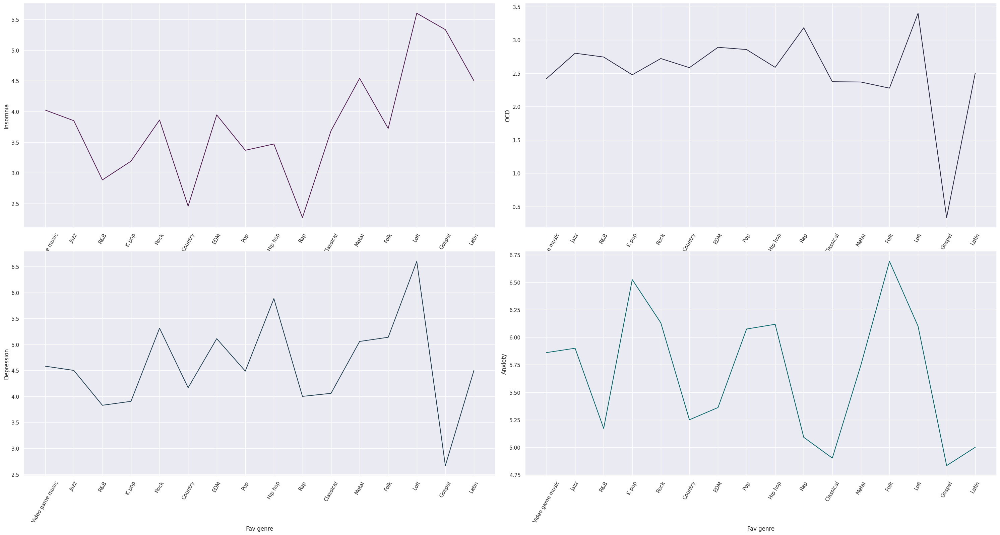

In [236]:
figure,axes=plt.subplots(2,2,figsize=(30,15))
sns.lineplot(ax=axes[0,0],x=dff['Fav genre'],y=dff['Insomnia'],ci=None,color='#4D194D')
sns.lineplot(ax=axes[0,1],x=dff['Fav genre'],y=dff['OCD'],ci=None,color='#272640')
sns.lineplot(ax=axes[1,0],x=dff['Fav genre'],y=dff['Depression'],ci=None,color='#1B3A4B')
sns.lineplot(ax=axes[1,1],x=dff['Fav genre'],y=dff['Anxiety'],ci=None,color='#006466')
plt.tight_layout()
for ax in axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=60)
plt.show()

Participants exhibiting high levels of insomnia show a preference for gospel music over country music. Those with high OCD tend to favor Lofi and Rap genres the most. Similarly, individuals experiencing high levels of depression show a preference for Lofi and Hip hop music. Lastly, participants with high levels of anxiety tend to listen most to Folk, K-pop, Jazz, and Rock music genres.

Insomnia: Individuals with insomnia may find solace in calming and soothing music like gospel, which could potentially help them relax or distract from their sleep difficulties.

OCD: Lofi and Rap music genres, characterized by repetitive beats and rhythms, might appeal to individuals with OCD tendencies who seek comfort in structured patterns or rhythms.

Depression: Lofi and Hip hop music, often expressing introspective themes and emotions, could resonate with those experiencing depression, offering a way to connect emotionally with the music.

Anxiety: Folk, K-pop, Jazz, and Rock music genres vary widely in style but may offer different forms of emotional release or distraction for individuals dealing with anxiety, depending on personal preference for rhythmic complexity, lyrical content, or instrumental elements.

In [237]:
colors = ['#006466', '#065A60', '#0B525B', '#144552','#1B3A4B', '#212F45', '#272640', '#312244','#3E1F47', '#4D194D']
fig = px.pie(dff, names='Fav genre', title='Genre Preferences',color_discrete_sequence=colors)
fig.show()

In [238]:
colors = ['#312244', '#212F45', '#144552', '#006466']
fig = px.sunburst(dff, path=["Fav genre"], values="Hours per day", color="Music effects",color_discrete_sequence=colors)
total = dff["Hours per day"].sum()
fig.update_traces(textinfo="label+percent entry")
fig.update_layout(
    title="Top Fav Genre VS Hours per day",
    title_font={"size": 20},
    margin=dict(t=50, b=50, l=0, r=0))
fig.update_layout(width=1000, height=800)
fig.show()

In [239]:
percentages = dff['Fav genre'].value_counts(normalize=True) * 100
print(percentages)

Fav genre
Rock                25.626741
Pop                 15.877437
Metal               12.116992
Classical            7.103064
Video game music     5.988858
EDM                  5.013928
R&B                  4.874652
Hip hop              4.735376
Folk                 4.038997
Country              3.342618
Rap                  3.064067
K pop                2.924791
Jazz                 2.785515
Lofi                 1.392758
Gospel               0.835655
Latin                0.278552
Name: proportion, dtype: float64


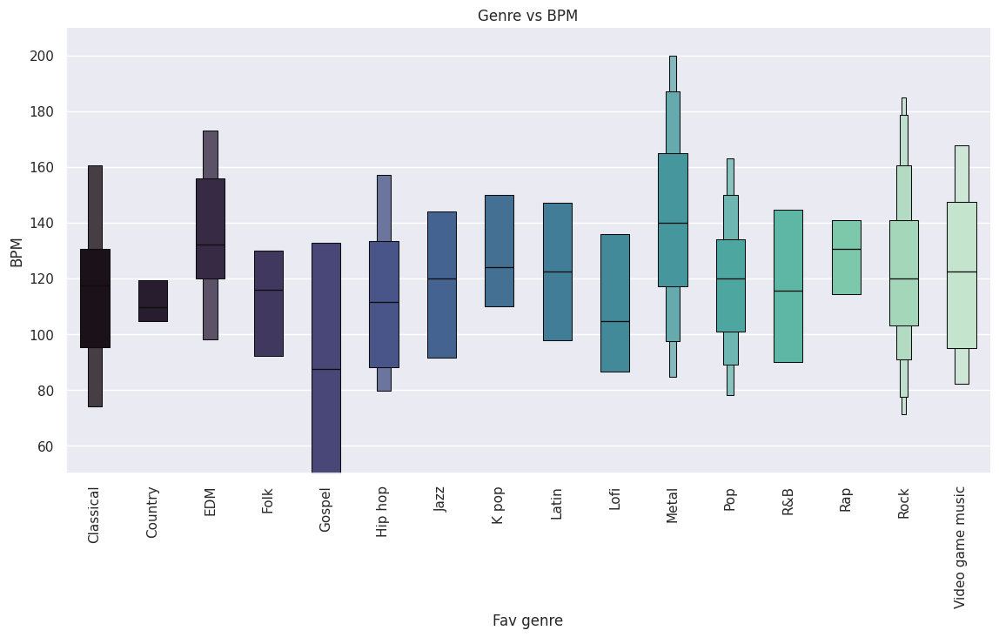

In [240]:
sns.catplot(
    data=dff.sort_values("Fav genre"),
    x="Fav genre", y="BPM", kind="boxen",height=6, aspect=2,width = 0.5,showfliers=False, palette='mako')
plt.xticks(rotation = 90)
plt.title('Genre vs BPM')
plt.ylim(50, 210)
plt.show()

Creating the Plot:
The sns.catplot function is used to create the boxen plot. This function is a versatile tool for creating various types of categorical plots. The parameters specified include:

data: The sorted DataFrame dff.
x: The column "Fav genre", which will be displayed on the x-axis.
y: The column "BPM", which will be displayed on the y-axis.
kind: Specifies the type of plot, which in this case is "boxen" (a type of box plot designed to handle larger datasets).
height: The height of the plot.
aspect: The aspect ratio of the plot (width/height).
width: The width of the individual boxes in the plot.
showfliers: Set to False to hide the outliers in the plot.
palette: The color palette used for the plot, set to 'mako'.
Customizing the Plot:
The x-axis labels (genres) are rotated by 90 degrees using plt.xticks(rotation = 90) to make them more readable. The plot is given a title "Genre vs BPM" using plt.title('Genre vs BPM'). The y-axis is limited to the range 50 to 210 using plt.ylim(50, 210) to focus on the most relevant BPM values.

Displaying the Plot:
Finally, plt.show() is called to render and display the plot. This visualization helps in understanding the distribution and range of BPM values across different favorite music genres, providing insights into how genre preferences might relate to tempo.

Overall, this plot effectively communicates the variation in BPM across different music genres, highlighting trends and patterns that might be of interest for further analysis or discussion

<Axes: xlabel='Fav genre', ylabel='Hours per day'>

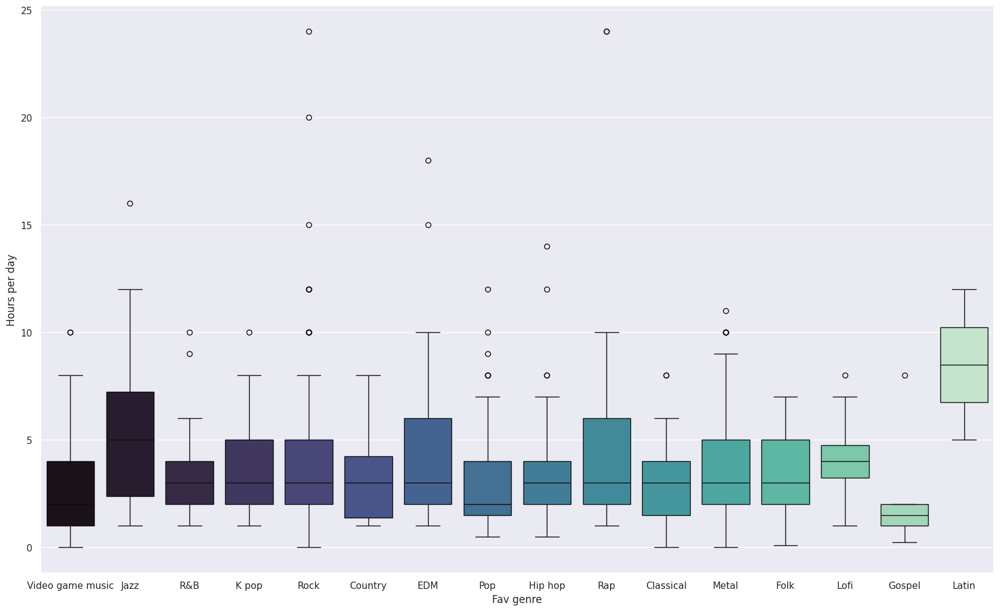

In [241]:
sns.boxplot(x=dff['Fav genre'], y=dff['Hours per day'], palette='mako')

Data Representation: The x-axis categorizes music genres, while the y-axis represents the distribution of "Hours per day" values. Each box in the plot illustrates the interquartile range (IQR) of listening hours for a specific genre, with a line inside marking the median value.

Visual Insights: By using distinct colors from the 'mako' palette, the plot enhances visual distinction between genres. It allows quick identification of genres with higher or lower median listening times and provides insight into the spread of listening habits within each genre.

Analytical Use: This visualization aids in understanding how music genre preferences influence daily listening habits. It's particularly useful for comparing music consumption patterns across different genres and identifying potential outliers or variations in listening behaviors.

Conclusion:
Practical Application: Seaborn's box plot is an effective tool for summarizing and comparing numerical data across categorical variables. In this case, it offers a clear depiction of how favorite music genres correlate with the amount of time spent listening to music daily, providing valuable insights into music consumption behaviors among different audiences.

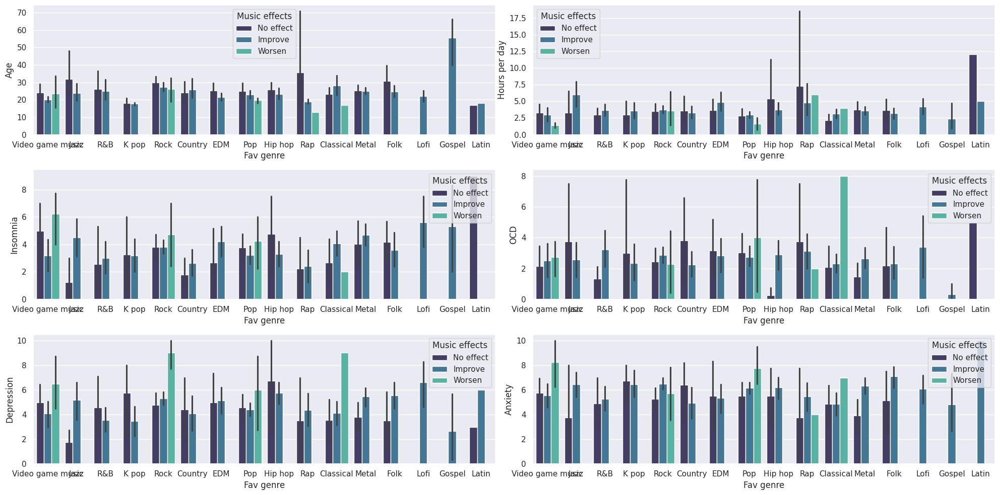

In [242]:
figure,axes=plt.subplots(3,2,figsize=(20,10))
sns.barplot(ax=axes[0,0],x=dff['Fav genre'],y=dff['Age'],hue=dff['Music effects'],palette="mako")
sns.barplot(ax=axes[0,1],x=dff['Fav genre'],y=dff['Hours per day'],hue=dff['Music effects'],palette="mako")
sns.barplot(ax=axes[1,0],x=dff['Fav genre'],y=dff['Insomnia'],hue=dff['Music effects'],palette="mako")
sns.barplot(ax=axes[1,1],x=dff['Fav genre'],y=dff['OCD'],hue=dff['Music effects'],palette="mako")
sns.barplot(ax=axes[2,0],x=dff['Fav genre'],y=dff['Depression'],hue=dff['Music effects'],palette="mako")
sns.barplot(ax=axes[2,1],x=dff['Fav genre'],y=dff['Anxiety'],hue=dff['Music effects'],palette="mako")
plt.tight_layout()
plt.show()

Based on the above charts, the following observations can be made:

Gospel Music: Most commonly listened to by individuals experiencing insomnia and in older age groups, where it has been reported to help improve the condition.

Lofi Music: Predominantly favored by individuals dealing with OCD, Anxiety, and Depression, typically in their mid-20s. It has shown to improve these conditions among participants.

Video Game Music: Shows a detrimental effect on all mental health conditions and should therefore be avoided. Listeners are usually in their early 20s, suggesting potential impacts on social functioning.

R&B, Jazz, K-pop, Country, EDM, Hip hop, Folk, Metal, and Latin Music: Generally either have a positive impact in improving mental health conditions or have no discernible negative effects reported.

Rock Music: Should be avoided by individuals dealing with Insomnia and Depression due to its potential to worsen these conditions more than improve them.

Classical Music: Should be avoided by individuals dealing with OCD, Anxiety, and Depression as it has a higher likelihood of worsening these conditions compared to improving them. However, it shows potential for improving Insomnia.

Listening Habits: Listening to Lofi and Gospel music for 4-6 hours has been associated with improvements in the mentioned conditions. Conversely, even 2 hours of exposure to Video Game music and pop has shown worsening effects in some participants.

Anxiety Levels:

All listeners have some degree of anxiety, but those who favor Rock, Jazz, K-pop, Hip hop, Pop, and Folk music are particularly affected, with anxiety levels exceeding 6. This suggests that these genres might be associated with higher stress or anxiety, possibly due to their energetic or emotionally charged nature.
Insomnia Levels:

Generally, listeners experience low levels of insomnia (below 4). However, those who listen to Metal, Lofi, and Gospel music experience higher levels of insomnia. This could be due to the intense or calming effects of these genres, which might impact sleep patterns differently.
OCD Levels:

OCD tendencies are more pronounced in listeners of Rap and Lofi music, with maximum levels above 3. This indicates a potential correlation between these genres and obsessive-compulsive behaviors or traits.
Depression Levels:

High levels of depression (above 5) are noted among listeners of Lofi, Hip hop, and Rock music. These genres might resonate more with individuals experiencing depressive symptoms or might influence mood negatively.
Mental Health Improvements and Deteriorations:

While music generally provides therapeutic benefits, listeners of Rock, Video Game Music, Pop, Rap, and Classical music often experience worsening conditions. This suggests that these genres might exacerbate mental health issues for some individuals.
OCD and Music: Listeners of Rock, Video Game Music, Pop, Rap, and Classical music show varying levels of OCD, with the highest levels found among Classical music listeners. This might be due to the structured and repetitive nature of Classical music, which could influence obsessive behaviors.

Anxiety and Music: Anxiety is present in listeners of Rock, Video Game Music, Pop, and Classical music, with Video Game Music listeners exhibiting the highest levels. The immersive and often intense nature of Video Game Music might contribute to increased anxiety.

Insomnia and Music: Insomnia is notably present among listeners of Rock, Video Game Music, Pop, and Classical music. The stimulating nature of these genres, particularly Video Game Music, might disrupt sleep patterns.

Depression and Music: High levels of depression are found among listeners of Rock, Video Game Music, Pop, and Classical music. These genres might either attract listeners who are already depressed or contribute to depressive moods.

These insights underscore the importance of considering musical preferences and their potential impact on mental health conditions, highlighting certain genres that may be beneficial or detrimental depending on individual circumstances.

It's evident that various types of music can profoundly influence an individual's mental state. Therefore, considering one's current mood, overall disposition, and the duration of music exposure, recommendation systems in music applications can effectively suggest genres that potentially alleviate or improve their mental condition.
Music has a unique ability to evoke emotions and alter psychological states. For instance, genres like Gospel and Lofi have shown positive impacts on listeners dealing with specific conditions such as insomnia, OCD, anxiety, and depression. These findings suggest that tailored music recommendations can play a crucial role in enhancing mental well-being